In [103]:
'''Install snscrape first using:   pip3 install snscrape from an anaconda system prompt'''
# Libraries needed
import snscrape.modules.twitter as sntwitter

import numpy as np
import pandas as pd
import csv
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import seaborn as sns
import matplotlib.pyplot as plt

import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.tokenize import RegexpTokenizer, WhitespaceTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import string
from string import punctuation
import collections
from collections import Counter

import spacy
from spacy.lang.en.examples import sentences 
import en_core_web_sm

import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import KElbowVisualizer
# !pip3 install -U spacy
# !python3 -m spacy download en_core_web_sm
from textblob import TextBlob


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/hurtado/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/hurtado/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Fox News

In [104]:
# Creating list to append tweet data 
Fox_tweets_list1 = []
query = '(from:FoxNews)until:2022-06-05 since:2022-04-01'

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper(query=query).get_items()): #declare a username 
    if i>1500: #number of tweets you want to scrape
        break
    try:
        Fox_tweets_list1.append([tweet.date, tweet.content, tweet.user.username,tweet.likeCount]) #declare the attributes to be returned
    except:
        continue
# Creating a dataframe from the tweets list above 
Fox_tweets_df1 = pd.DataFrame(Fox_tweets_list1, columns=['Datetime', 'Text', 'User', 'likeCount'])
print(dir(tweet))

['__annotations__', '__class__', '__dataclass_fields__', '__dataclass_params__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'cashtags', 'content', 'conversationId', 'coordinates', 'date', 'hashtags', 'id', 'inReplyToTweetId', 'inReplyToUser', 'json', 'lang', 'likeCount', 'media', 'mentionedUsers', 'outlinks', 'outlinksss', 'place', 'quoteCount', 'quotedTweet', 'renderedContent', 'replyCount', 'retweetCount', 'retweetedTweet', 'source', 'sourceLabel', 'sourceUrl', 'tcooutlinks', 'tcooutlinksss', 'url', 'user', 'username']


In [105]:
Fox_tweets_df1

,Datetime,Text,User,likeCount
0,2022-06-04 23:55:06+00:00,Lawrence Jones on Seattle PD being unable to i...,FoxNews,266
1,2022-06-04 23:50:06+00:00,'CAN'T GO AFTER CRIMINALS': A Seattle radio ho...,FoxNews,277
2,2022-06-04 23:49:41+00:00,Teen allegedly threatens to kill sheriff over ...,FoxNews,91
3,2022-06-04 23:40:43+00:00,Shakira and her boyfriend Gerard Pique have se...,FoxNews,220
4,2022-06-04 23:40:33+00:00,Prince Harry looked 'deeply unhappy' during Se...,FoxNews,217
...,...,...,...,...
1496,2022-05-28 21:00:03+00:00,"Ukraine needs to face reality to end conflict,...",FoxNews,203
1497,2022-05-28 20:55:02+00:00,Former homicide detective urges caution as out...,FoxNews,196
1498,2022-05-28 20:50:06+00:00,"Matthew McConaughey visits Uvalde, Texas homet...",FoxNews,471
1499,2022-05-28 20:40:48+00:00,Detroit Tigers funneling money for irreversibl...,FoxNews,288


## Text Classification
### Cleaning the tweets

Lemmatization, tokenizing, removing stopwards, punctuations, hashtags and mentions were done.

In [106]:
# remove the hashtags, mentions and unwanted characters from the tweet texts
def clean_text(df, text_field):
    df[text_field] = df[text_field].str.lower()
    df[text_field] = df[text_field].apply(lambda elem: re.sub(r"(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", "", elem))  
    return df

In [107]:
#remove stopwords, punctuations, lemmatize and tokenize word
# nlp = spacy.load("en_core_web_sm")   #working with english only, 
nlp = spacy.load("en_core_web_sm")
tokenizer = RegexpTokenizer(r'\w+')
lemmatizer = WordNetLemmatizer()
stop = set(stopwords.words('english'))
punctuation = list(string.punctuation) #already taken care of with the cleaning function.
stop.update(punctuation)
w_tokenizer = WhitespaceTokenizer()

def furnished(text):
    final_text = []
    for i in w_tokenizer.tokenize(text):
#     for i in text.split():
        if i.lower() not in stop:
            word = lemmatizer.lemmatize(i)
            final_text.append(word.lower())
    return " ".join(final_text)    

In [108]:
Fox_clean_tweets = clean_text(Fox_tweets_df1, 'Text')
Fox_clean_tweets.head()

,Datetime,Text,User,likeCount
0,2022-06-04 23:55:06+00:00,lawrence jones on seattle pd being unable to i...,FoxNews,266
1,2022-06-04 23:50:06+00:00,cant go after criminals a seattle radio host s...,FoxNews,277
2,2022-06-04 23:49:41+00:00,teen allegedly threatens to kill sheriff over ...,FoxNews,91
3,2022-06-04 23:40:43+00:00,shakira and her boyfriend gerard pique have se...,FoxNews,220
4,2022-06-04 23:40:33+00:00,prince harry looked deeply unhappy during serv...,FoxNews,217


In [109]:
Fox_clean_tweets.Text = Fox_clean_tweets.Text.apply(furnished)
Fox_clean_tweets

,Datetime,Text,User,likeCount
0,2022-06-04 23:55:06+00:00,lawrence jones seattle pd unable investigate n...,FoxNews,266
1,2022-06-04 23:50:06+00:00,cant go criminal seattle radio host said acros...,FoxNews,277
2,2022-06-04 23:49:41+00:00,teen allegedly threatens kill sheriff rapper y...,FoxNews,91
3,2022-06-04 23:40:43+00:00,shakira boyfriend gerard pique separated,FoxNews,220
4,2022-06-04 23:40:33+00:00,prince harry looked deeply unhappy service tha...,FoxNews,217
...,...,...,...,...
1496,2022-05-28 21:00:03+00:00,ukraine need face reality end conflict talk pu...,FoxNews,203
1497,2022-05-28 20:55:02+00:00,former homicide detective urge caution outrage...,FoxNews,196
1498,2022-05-28 20:50:06+00:00,matthew mcconaughey visit uvalde texas hometow...,FoxNews,471
1499,2022-05-28 20:40:48+00:00,detroit tiger funneling money irreversible tra...,FoxNews,288


### K-means Clustering

In [110]:
#Changing the tweet to unicode, 
#it is univsersal we will change string to unicode then use vectorizer
FoxDoc=Fox_clean_tweets['Text'].values.astype('U')

In [111]:
vectorizer = TfidfVectorizer(stop_words= 'english')
Foxfeatures=vectorizer.fit_transform(FoxDoc)

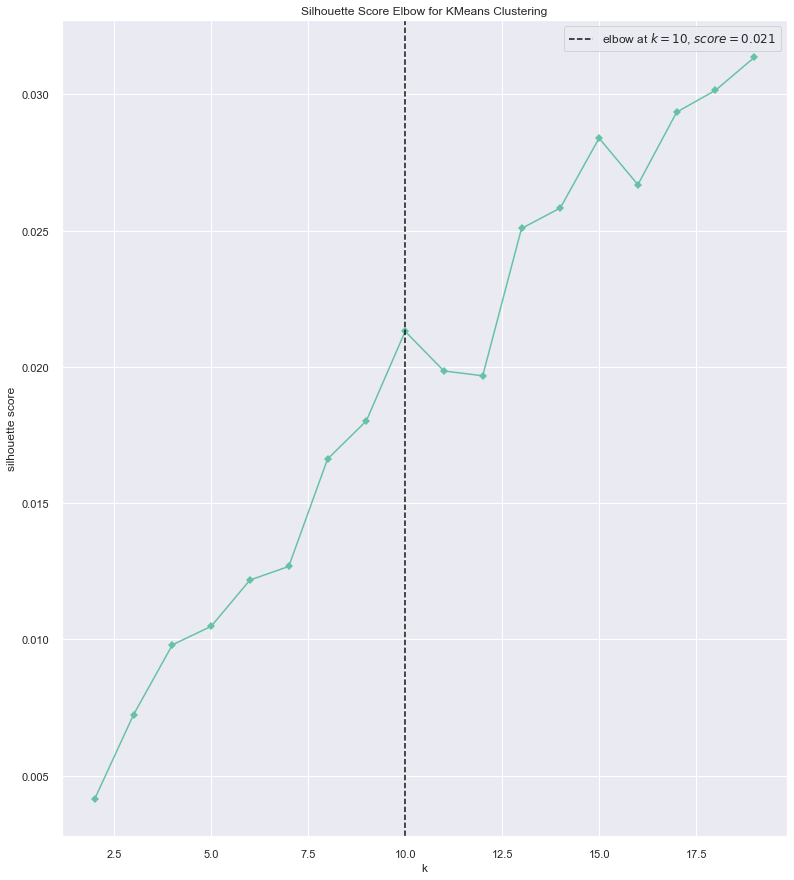

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [112]:
# Process clustering model and visualizer 
model=KMeans()
visualizer = KElbowVisualizer(model, k=(2,20), metric='silhouette', timings=False)

visualizer.fit(Foxfeatures.toarray())# convert sparse matrix to dense data and fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

In [113]:
k =10
FoxModel = KMeans(n_clusters=k,init='k-means++',max_iter=100,n_init=1)
FoxModel.fit(Foxfeatures)


KMeans(max_iter=100, n_clusters=10, n_init=1)

### Perform Comparative Analysis to Determine Best Value of K Using Silhouette Plot
Silhouette score is used to evaluate the quality of clusters created using clustering algorithms such as K-Means in terms of how well samples are clustered with other samples that are similar to each other. The Silhouette score is calculated for each sample of different clusters. To calculate the Silhouette score for each observation/data point, the following distances need to be found out for each observations belonging to all the clusters:

Mean distance between the observation and all other data points in the same cluster. This distance can also be called a mean intra-cluster distance. The mean distance is denoted by a

Mean distance between the observation and all other data points of the next nearest cluster. This distance can also be called a mean nearest-cluster distance. The mean distance is denoted by b

The value of the Silhouette score varies from -1 to 1. If the score is 1, the cluster is dense and well-separated than other clusters. A value near 0 represents overlapping clusters with samples very close to the decision boundary of the neighboring clusters. A negative score [-1, 0] indicates that the samples might have got assigned to the wrong clusters

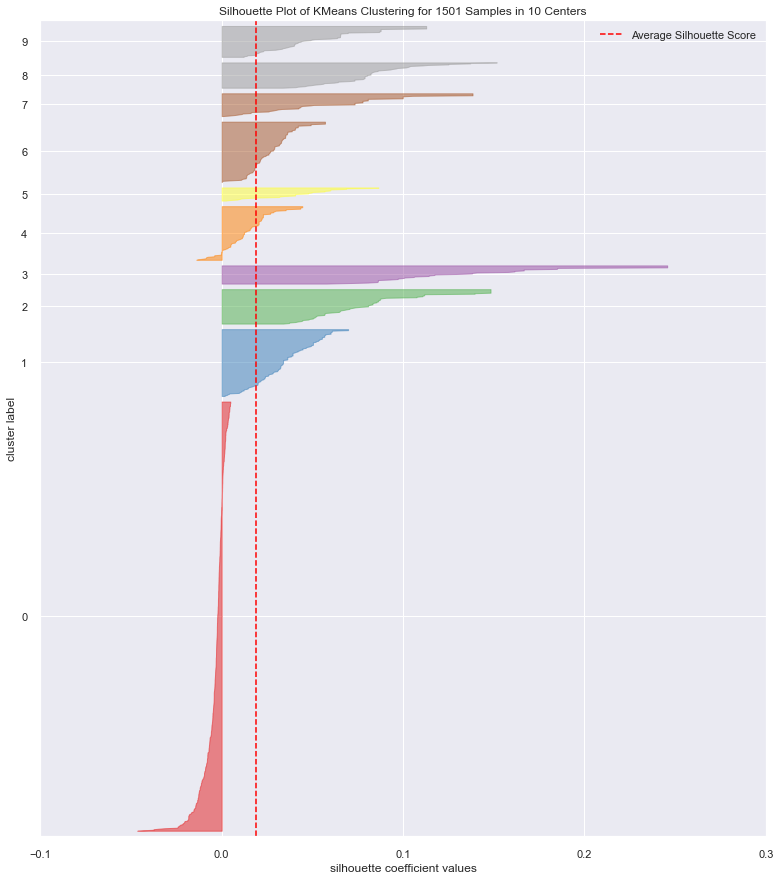

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 1501 Samples in 10 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [114]:
visualizer=SilhouetteVisualizer(FoxModel)
visualizer.fit(Foxfeatures)
visualizer.poof()

In [115]:
Fox_clean_tweets['cluster']=FoxModel.labels_

In [116]:
Fox_clean_tweets.tail()

,Datetime,Text,User,likeCount,cluster
1496,2022-05-28 21:00:03+00:00,ukraine need face reality end conflict talk pu...,FoxNews,203,7
1497,2022-05-28 20:55:02+00:00,former homicide detective urge caution outrage...,FoxNews,196,1
1498,2022-05-28 20:50:06+00:00,matthew mcconaughey visit uvalde texas hometow...,FoxNews,471,1
1499,2022-05-28 20:40:48+00:00,detroit tiger funneling money irreversible tra...,FoxNews,288,0
1500,2022-05-28 20:38:41+00:00,conjuring house sell 12m asking price,FoxNews,171,0


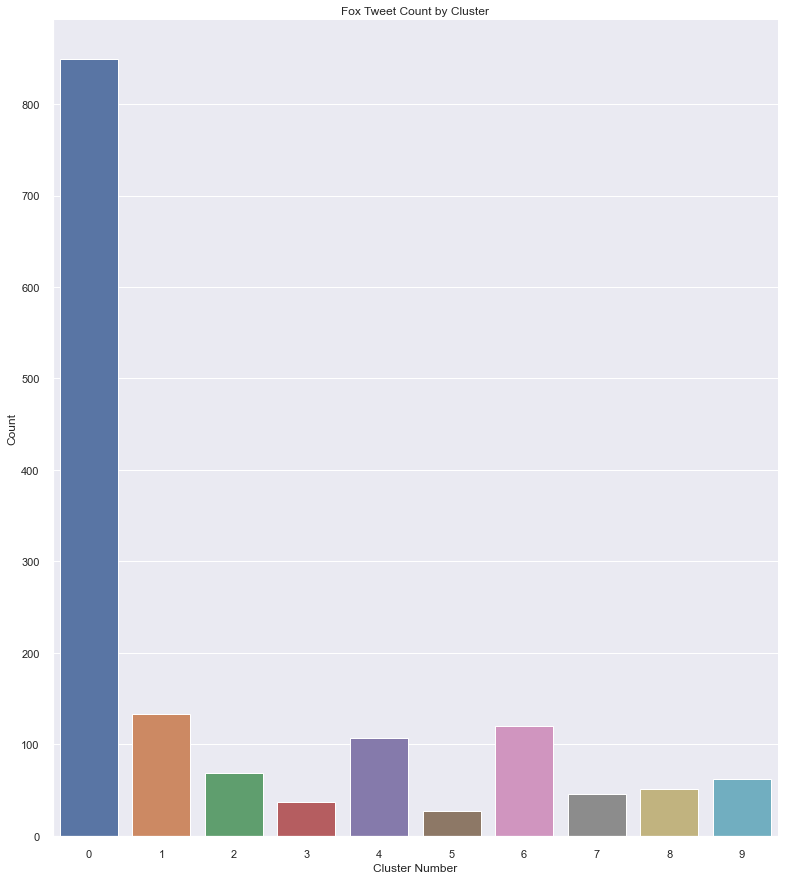

In [117]:
#Distribution of Fox Tweets by Cluster

#set seaborn plotting aesthetics
Fox_clean_tweets.sort_values(by=['cluster'])
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.set(rc={'figure.figsize':(13,15)})
Fox_clustersfreq=sns.countplot(data=Fox_clean_tweets, x='cluster')
plt.title('Fox Tweet Count by Cluster')
plt.xlabel('Cluster Number')
plt.ylabel('Count')
plt.xticks(rotation=360)
sns.despine()
plt.show()

In [118]:
# Output cluster results to a csv file
Foxclusters=Fox_clean_tweets.groupby('cluster')
for cluster in Foxclusters.groups:
    f=open('cluster'+str(cluster)+'.csv','w') #create a csv file
    data=Foxclusters.get_group(cluster)[['Datetime','Text']] #include columns of interest
    f.write(data.to_csv(index=True))
    f.close()

In [1]:
#What is Clustering referring to?
#Check central of gravity of clusters and print feature forms

print('Fox Cluster centroids: \n')
order_centroids=FoxModel.cluster_centers_.argsort()[:,::-1]
terms=vectorizer.get_feature_names()

for i in range(k):
    print('Cluster %d:' % i)
    for j in order_centroids[i, :10]:
        print(' %s' % terms[j])
    print('------------')

Fox Cluster centroids: 



NameError: name 'FoxModel' is not defined

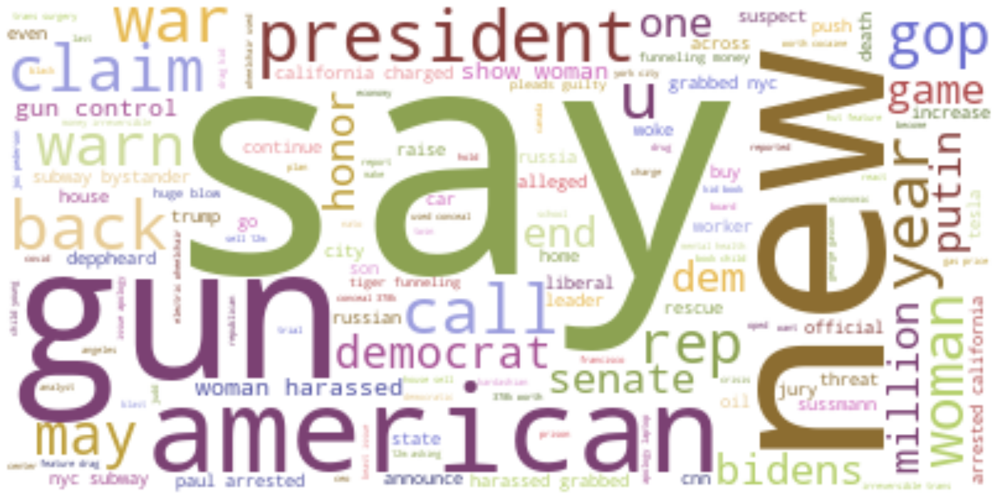

In [120]:
#Fox Cluster 0 Wordcloud 

#Load Fox Cluster0 as pandas df
FC0=pd.read_csv('cluster0.csv') 

#create text list of all words in Fox cluster 0
ftext="".join(review for review in FC0.Text.astype(str))

#Generate word cloud
FC0_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
FC0_WC.generate(ftext)
plt.figure(figsize=(20,10))
plt.imshow(FC0_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()


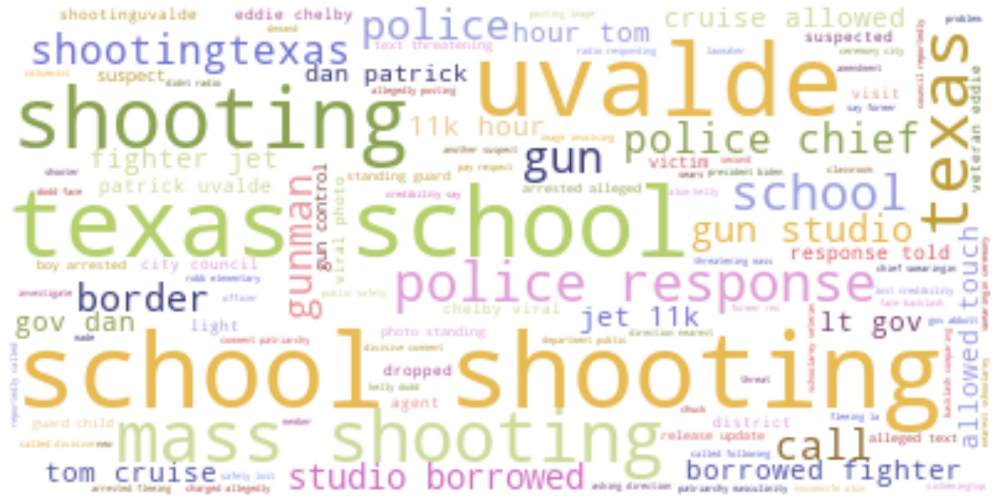

In [121]:
#Fox Cluster 1 Wordcloud 

#Load Fox Cluster1 as pandas df
FC1=pd.read_csv('cluster1.csv') 

#create text list of all words in Fox cluster 1
ftext1="".join(review for review in FC1.Text.astype(str))

#Generate word cloud
FC1_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
FC1_WC.generate(ftext1)
plt.figure(figsize=(20,10))
plt.imshow(FC1_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()



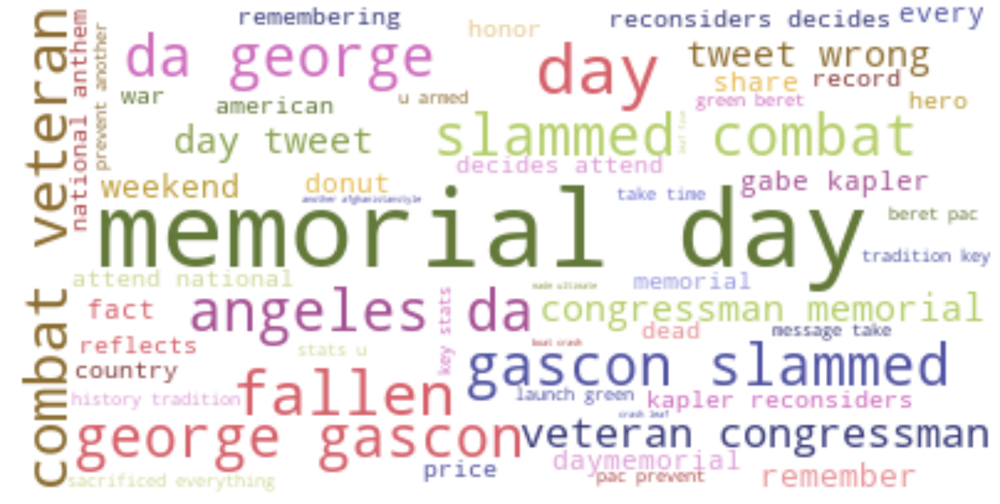

In [122]:
#Fox Cluster 2 Wordcloud 

#Load Fox Cluster2 as pandas df
FC2=pd.read_csv('cluster2.csv') 

#create text list of all words in Fox cluster 2
ftext2="".join(review for review in FC2.Text.astype(str))

#Generate word cloud
FC2_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
FC2_WC.generate(ftext2)
plt.figure(figsize=(20,10))
plt.imshow(FC2_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()



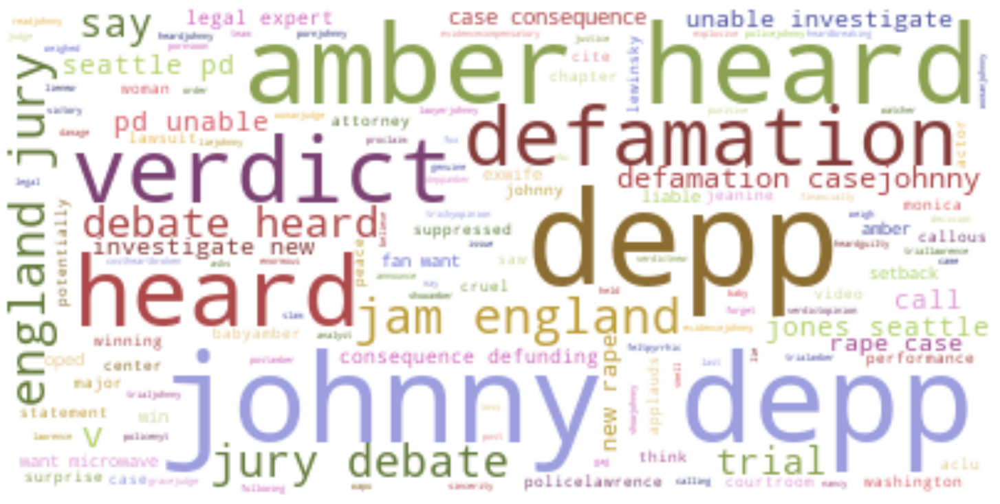

In [123]:
#Fox Cluster 3 Wordcloud 

#Load Fox Cluster3 as pandas df
FC3=pd.read_csv('cluster3.csv') 

#create text list of all words in Fox cluster 3
ftext3="".join(review for review in FC3.Text.astype(str))

#Generate word cloud
FC3_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
FC3_WC.generate(ftext3)
plt.figure(figsize=(20,10))
plt.imshow(FC3_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()



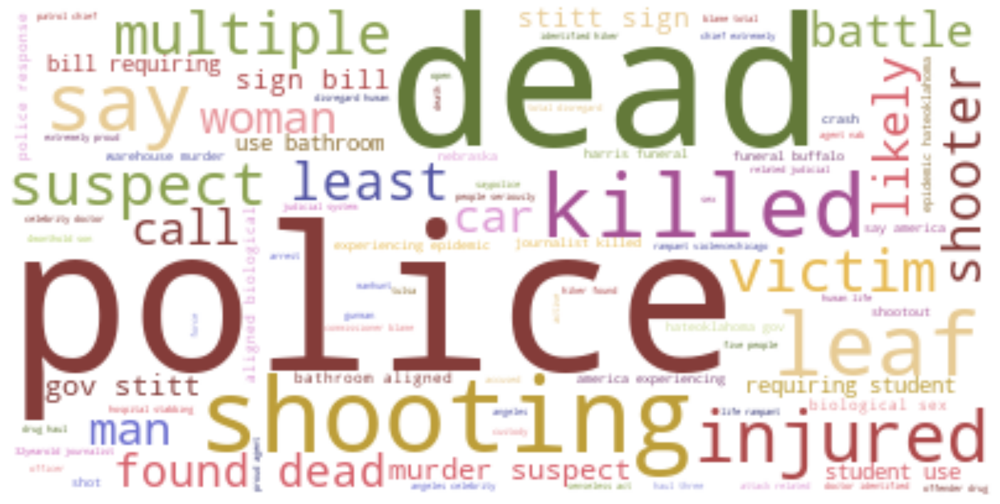

In [124]:
#Fox Cluster 4 Wordcloud 

#Load Fox Cluster4 as pandas df
FC4=pd.read_csv('cluster4.csv') 

#create text list of all words in Fox cluster 4
ftext4="".join(review for review in FC4.Text.astype(str))

#Generate word cloud
FC4_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
FC4_WC.generate(ftext4)
plt.figure(figsize=(20,10))
plt.imshow(FC4_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

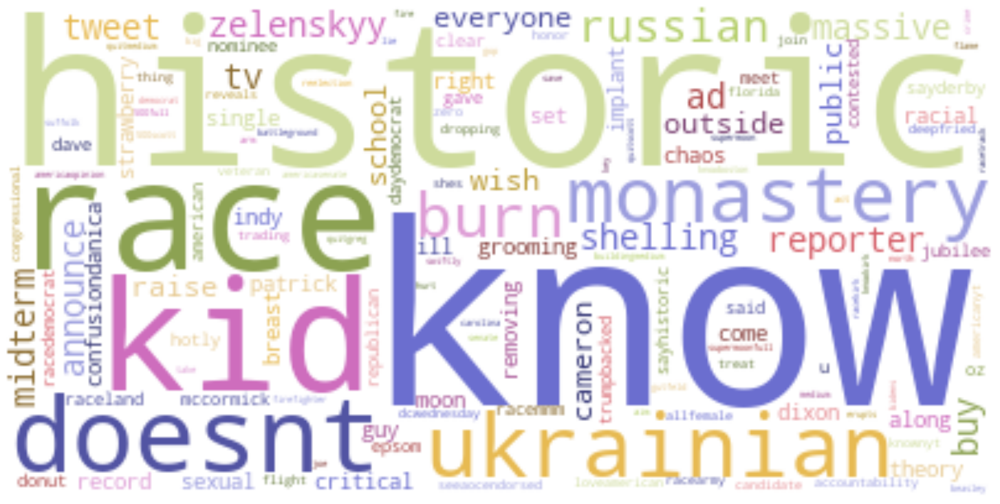

In [125]:
#Fox Cluster 5 Wordcloud 

#Load Fox Cluster5 as pandas df
FC5=pd.read_csv('cluster5.csv') 

#create text list of all words in Fox cluster 5
ftext5="".join(review for review in FC5.Text.astype(str))

#Generate word cloud
FC5_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
FC5_WC.generate(ftext5)
plt.figure(figsize=(20,10))
plt.imshow(FC5_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

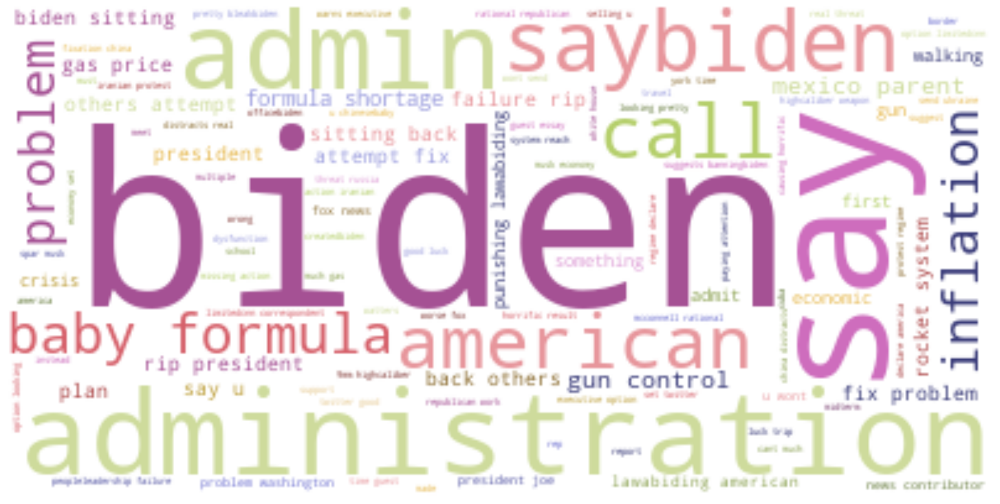

In [126]:
#Fox Cluster 6 Wordcloud 

#Load Fox Cluster6 as pandas df
FC6=pd.read_csv('cluster6.csv') 

#create text list of all words in Fox cluster 6
ftext6="".join(review for review in FC6.Text.astype(str))

#Generate word cloud
FC6_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
FC6_WC.generate(ftext6)
plt.figure(figsize=(20,10))
plt.imshow(FC6_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

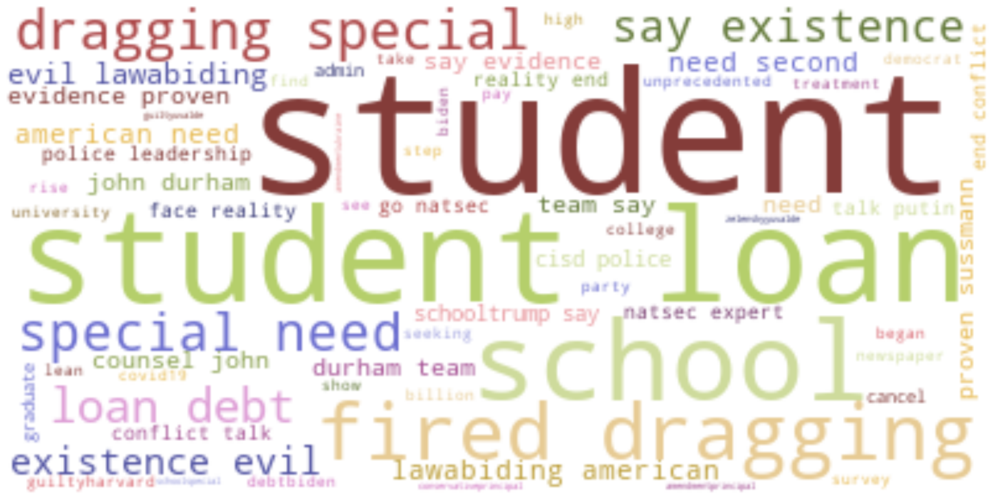

In [127]:
#Fox Cluster 7 Wordcloud 

#Load Fox Cluster7 as pandas df
FC7=pd.read_csv('cluster7.csv') 

#create text list of all words in Fox cluster 7
ftext7="".join(review for review in FC7.Text.astype(str))

#Generate word cloud
FC7_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
FC7_WC.generate(ftext7)
plt.figure(figsize=(20,10))
plt.imshow(FC7_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

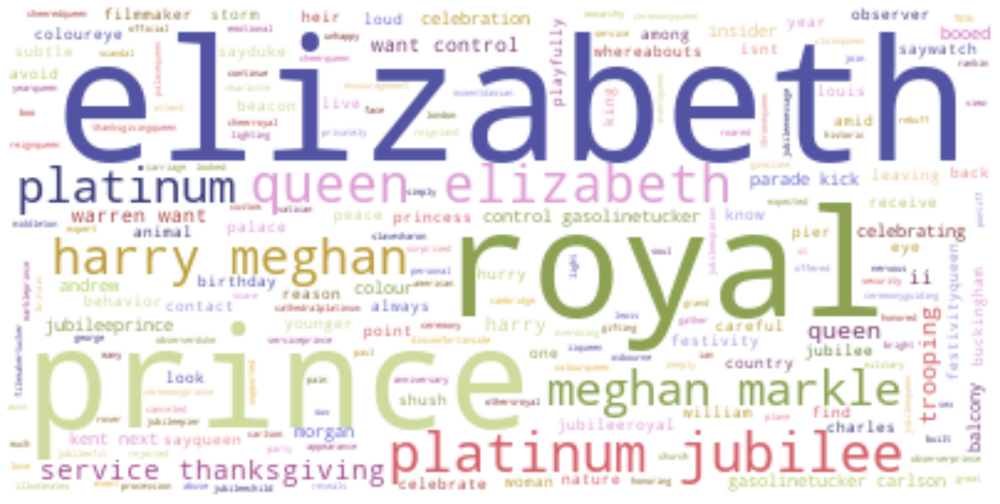

In [128]:
#Fox Cluster 8 Wordcloud 

#Load Fox Cluster8 as pandas df
FC8=pd.read_csv('cluster8.csv') 

#create text list of all words in Fox cluster 8
ftext8="".join(review for review in FC8.Text.astype(str))

#Generate word cloud
FC8_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
FC8_WC.generate(ftext8)
plt.figure(figsize=(20,10))
plt.imshow(FC8_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

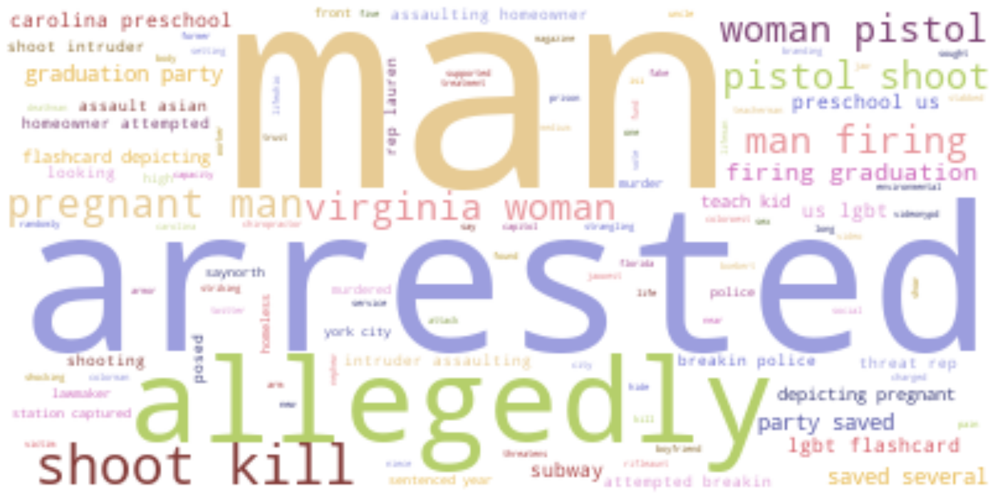

In [129]:
#Fox Cluster 9 Wordcloud 

#Load Fox Cluster9 as pandas df
FC9=pd.read_csv('cluster9.csv') 

#create text list of all words in Fox cluster 9
ftext9="".join(review for review in FC9.Text.astype(str))

#Generate word cloud
FC9_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
FC9_WC.generate(ftext9)
plt.figure(figsize=(20,10))
plt.imshow(FC9_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Sentiment Analysis

In [130]:

Fox_clean_tweets['polarity'] = Fox_clean_tweets['Text'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)


In [131]:


Fox_clean_tweets['subjectivity'] = Fox_clean_tweets['Text'].apply(lambda tweet: TextBlob(tweet).sentiment.subjectivity)

In [132]:
Fox_clean_tweets

,Datetime,Text,User,likeCount,cluster,polarity,subjectivity
0,2022-06-04 23:55:06+00:00,lawrence jones seattle pd unable investigate n...,FoxNews,266,3,-0.181818,0.477273
1,2022-06-04 23:50:06+00:00,cant go criminal seattle radio host said acros...,FoxNews,277,0,-0.200000,0.383333
2,2022-06-04 23:49:41+00:00,teen allegedly threatens kill sheriff rapper y...,FoxNews,91,0,-0.012500,0.125000
3,2022-06-04 23:40:43+00:00,shakira boyfriend gerard pique separated,FoxNews,220,0,0.000000,0.000000
4,2022-06-04 23:40:33+00:00,prince harry looked deeply unhappy service tha...,FoxNews,217,8,-0.600000,0.900000
...,...,...,...,...,...,...,...
1496,2022-05-28 21:00:03+00:00,ukraine need face reality end conflict talk pu...,FoxNews,203,7,0.000000,0.000000
1497,2022-05-28 20:55:02+00:00,former homicide detective urge caution outrage...,FoxNews,196,1,0.000000,0.000000
1498,2022-05-28 20:50:06+00:00,matthew mcconaughey visit uvalde texas hometow...,FoxNews,471,1,-0.075000,0.050000
1499,2022-05-28 20:40:48+00:00,detroit tiger funneling money irreversible tra...,FoxNews,288,0,0.000000,0.000000


In [133]:
score = Fox_clean_tweets["polarity"].values
sentiment = []
for i in score:
    if i >= 0.05 :
        sentiment.append('Positive')
    elif i <= -0.05 :
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
Fox_clean_tweets["Sentiment"] = sentiment


subscore = Fox_clean_tweets["subjectivity"].values
sub = []
for i in subscore:
    if i >= 0.6 :
        sub.append('Highly Subjective')
    elif i <= 0.4 :
        sub.append('Objective')
    else:
        sub.append('Subjective')
Fox_clean_tweets["Subjective"] = sub


In [134]:
Fox_clean_tweets

,Datetime,Text,User,likeCount,cluster,polarity,subjectivity,Sentiment,Subjective
0,2022-06-04 23:55:06+00:00,lawrence jones seattle pd unable investigate n...,FoxNews,266,3,-0.181818,0.477273,Negative,Subjective
1,2022-06-04 23:50:06+00:00,cant go criminal seattle radio host said acros...,FoxNews,277,0,-0.200000,0.383333,Negative,Objective
2,2022-06-04 23:49:41+00:00,teen allegedly threatens kill sheriff rapper y...,FoxNews,91,0,-0.012500,0.125000,Neutral,Objective
3,2022-06-04 23:40:43+00:00,shakira boyfriend gerard pique separated,FoxNews,220,0,0.000000,0.000000,Neutral,Objective
4,2022-06-04 23:40:33+00:00,prince harry looked deeply unhappy service tha...,FoxNews,217,8,-0.600000,0.900000,Negative,Highly Subjective
...,...,...,...,...,...,...,...,...,...
1496,2022-05-28 21:00:03+00:00,ukraine need face reality end conflict talk pu...,FoxNews,203,7,0.000000,0.000000,Neutral,Objective
1497,2022-05-28 20:55:02+00:00,former homicide detective urge caution outrage...,FoxNews,196,1,0.000000,0.000000,Neutral,Objective
1498,2022-05-28 20:50:06+00:00,matthew mcconaughey visit uvalde texas hometow...,FoxNews,471,1,-0.075000,0.050000,Negative,Objective
1499,2022-05-28 20:40:48+00:00,detroit tiger funneling money irreversible tra...,FoxNews,288,0,0.000000,0.000000,Neutral,Objective


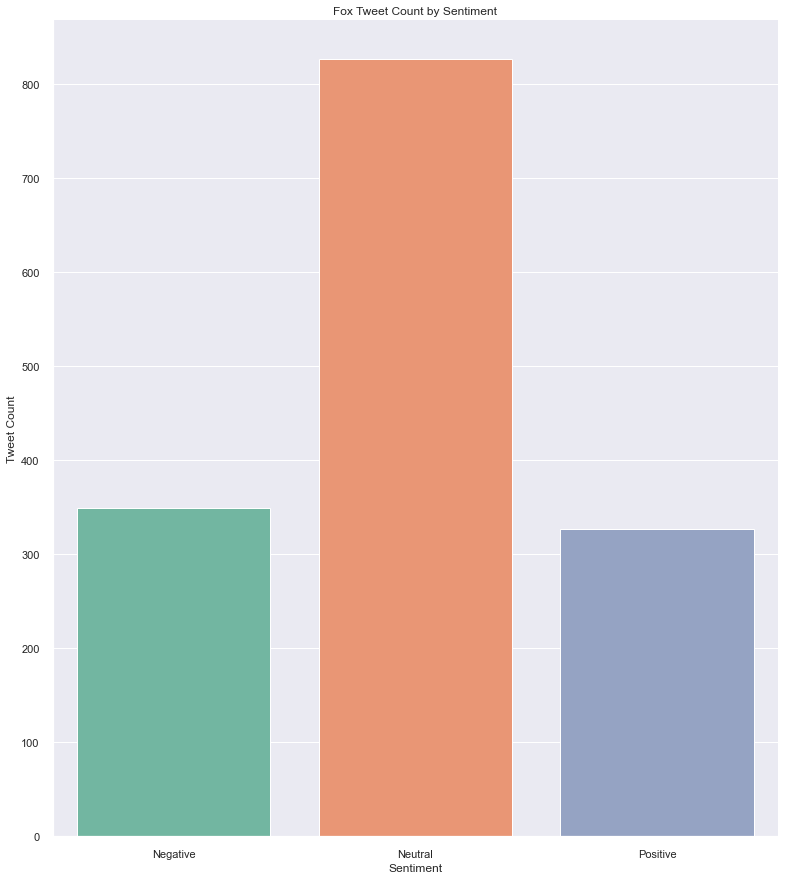

In [135]:
#Visualization of Sentiment results

sns.set_style('darkgrid')
sns.set_palette('Set2')
FoxSent=sns.countplot(data=Fox_clean_tweets, x='Sentiment')
plt.title('Fox Tweet Count by Sentiment')
plt.xlabel('Sentiment')
plt.ylabel('Tweet Count')
sns.despine()
plt.show()


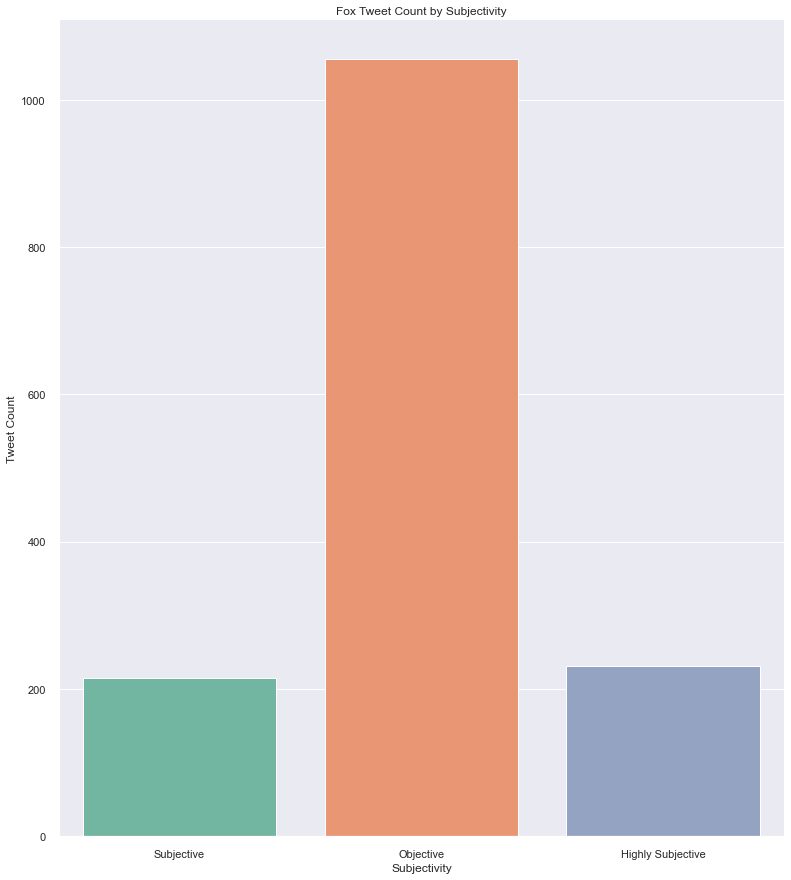

In [136]:
#Visualization of Subjectivity results
sns.set_style('darkgrid')
sns.set_palette('Set2')
FoxSent=sns.countplot(data=Fox_clean_tweets, x='Subjective')
plt.title('Fox Tweet Count by Subjectivity')
plt.xlabel('Subjectivity')
plt.ylabel('Tweet Count')
sns.despine()
plt.show()


# BBC News

In [137]:
# Creating list to append tweet data 
BBC_tweets_list1 = []
query = '(from:BBCWorld)until:2022-06-05 since:2022-04-01'

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper(query=query).get_items()): #declare a username 
    if i>1500: #number of tweets you want to scrape
        break
    try:
        BBC_tweets_list1.append([tweet.date, tweet.content, tweet.user.username,tweet.likeCount]) #declare the attributes to be returned
    except:
        continue
# Creating a dataframe from the tweets list above 
BBC_tweets_df1 = pd.DataFrame(BBC_tweets_list1, columns=['Datetime', 'Text', 'User','likeCount'])
print(dir(tweet))

['__annotations__', '__class__', '__dataclass_fields__', '__dataclass_params__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'cashtags', 'content', 'conversationId', 'coordinates', 'date', 'hashtags', 'id', 'inReplyToTweetId', 'inReplyToUser', 'json', 'lang', 'likeCount', 'media', 'mentionedUsers', 'outlinks', 'outlinksss', 'place', 'quoteCount', 'quotedTweet', 'renderedContent', 'replyCount', 'retweetCount', 'retweetedTweet', 'source', 'sourceLabel', 'sourceUrl', 'tcooutlinks', 'tcooutlinksss', 'url', 'user', 'username']


In [138]:
BBC_tweets_df1

,Datetime,Text,User,likeCount
0,2022-06-04 23:51:17+00:00,"Bangladesh: Five killed, scores injured in dep...",BBCWorld,180
1,2022-06-04 23:10:43+00:00,Queen's Platinum Jubilee: The Nigerian boss wh...,BBCWorld,483
2,2022-06-04 20:21:56+00:00,Nigeria clash: Abuja mob burns man to death ov...,BBCWorld,343
3,2022-06-04 18:56:30+00:00,Ukraine round-up: Defiance in Mykolaiv and a w...,BBCWorld,289
4,2022-06-04 16:49:14+00:00,Ukraine anger as Macron says 'Don't humiliate ...,BBCWorld,4192
...,...,...,...,...
1496,2022-05-01 16:59:06+00:00,Snapchat's flying selfie drone https://t.co/is...,BBCWorld,238
1497,2022-05-01 16:52:40+00:00,Mariupol civilian evacuation begins to both Uk...,BBCWorld,388
1498,2022-05-01 16:26:38+00:00,Satellite images capture damage to Avozstal st...,BBCWorld,246
1499,2022-05-01 15:59:21+00:00,Kylie Minogue and Jason Donovan return to Neig...,BBCWorld,319


In [139]:
#Clean BBC Tweets
BBC_clean_tweets = clean_text(BBC_tweets_df1, 'Text')
BBC_clean_tweets.Text = BBC_clean_tweets.Text.apply(furnished)
BBC_clean_tweets

,Datetime,Text,User,likeCount
0,2022-06-04 23:51:17+00:00,bangladesh five killed score injured depot blast,BBCWorld,180
1,2022-06-04 23:10:43+00:00,queen platinum jubilee nigerian bos applied mo...,BBCWorld,483
2,2022-06-04 20:21:56+00:00,nigeria clash abuja mob burn man death row mus...,BBCWorld,343
3,2022-06-04 18:56:30+00:00,ukraine roundup defiance mykolaiv wooden monas...,BBCWorld,289
4,2022-06-04 16:49:14+00:00,ukraine anger macron say dont humiliate russia,BBCWorld,4192
...,...,...,...,...
1496,2022-05-01 16:59:06+00:00,snapchats flying selfie drone,BBCWorld,238
1497,2022-05-01 16:52:40+00:00,mariupol civilian evacuation begin ukraine rus...,BBCWorld,388
1498,2022-05-01 16:26:38+00:00,satellite image capture damage avozstal steelw...,BBCWorld,246
1499,2022-05-01 15:59:21+00:00,kylie minogue jason donovan return neighbour,BBCWorld,319


### K-Means Clustering

In [140]:
#Changing the tweet to unicode, 
#it is univsersal we will change string to unicode then use vectorizer
BBCDoc=BBC_clean_tweets['Text'].values.astype('U')

In [141]:
vectorizer = TfidfVectorizer(stop_words= 'english')
BBCfeatures=vectorizer.fit_transform(BBCDoc)

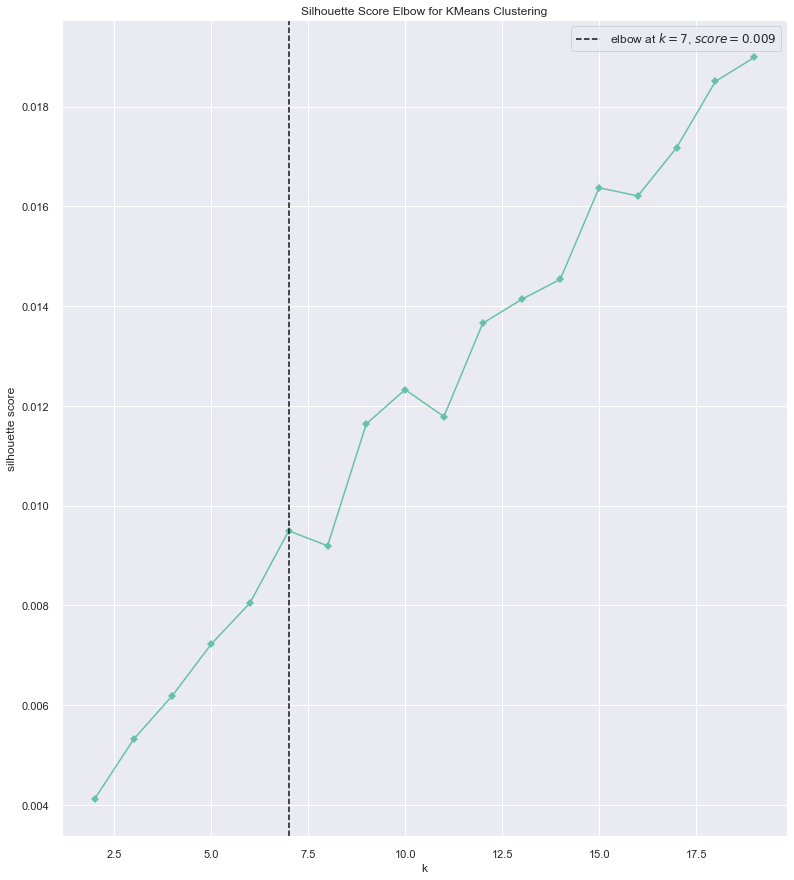

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [142]:
# Instantiate the clustering model and visualizer 
model=KMeans()
visualizer = KElbowVisualizer(model, k=(2,20), metric='silhouette', timings=False)

visualizer.fit(BBCfeatures.toarray())# convert sparse matrix to dense data and fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

In [143]:
k =7
BBCModel = KMeans(n_clusters=k,init='k-means++',max_iter=100,n_init=1)
BBCModel.fit(BBCfeatures)

KMeans(max_iter=100, n_clusters=7, n_init=1)

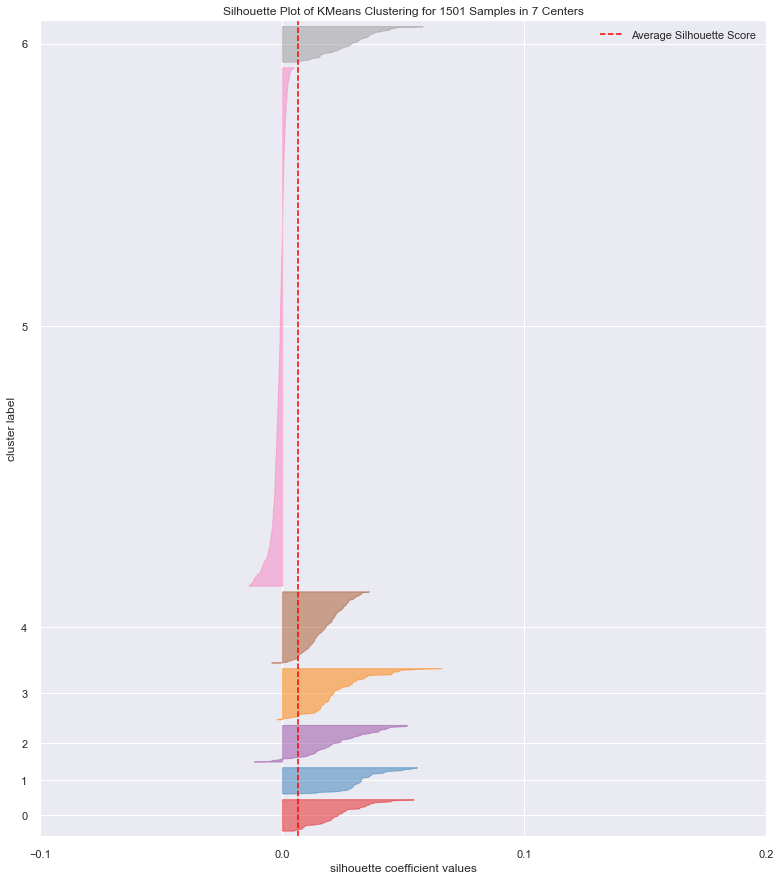

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 1501 Samples in 7 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [144]:
visualizer=SilhouetteVisualizer(BBCModel)
visualizer.fit(BBCfeatures)
visualizer.poof()

In [145]:
BBC_clean_tweets['cluster']=BBCModel.labels_

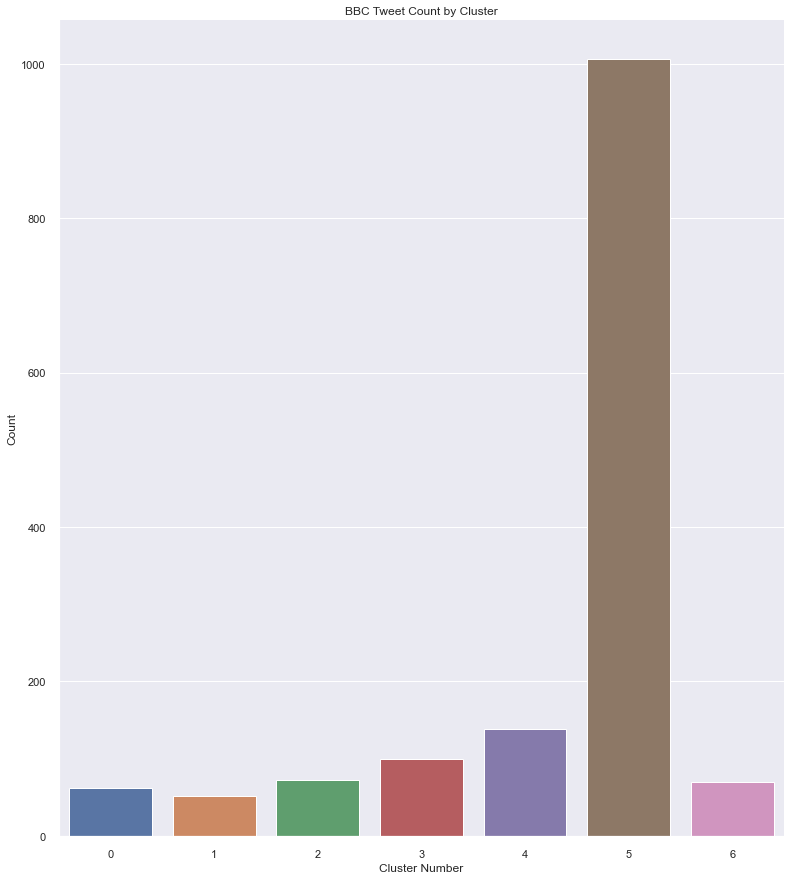

In [146]:
#Distribution of Fox Tweets by Cluster

#set seaborn plotting aesthetics
BBC_clean_tweets.sort_values(by=['cluster'])
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.set(rc={'figure.figsize':(13,15)})
BBC_clustersfreq=sns.countplot(data=BBC_clean_tweets, x='cluster')
plt.title('BBC Tweet Count by Cluster')
plt.xlabel('Cluster Number')
plt.ylabel('Count')
plt.xticks(rotation=360)
sns.despine()
plt.show()

In [147]:
# Output cluster results to a csv file
BBCclusters=BBC_clean_tweets.groupby('cluster')
for cluster in BBCclusters.groups:
    f=open('BBCcluster'+str(cluster)+'.csv','w') #create a csv file
    data=BBCclusters.get_group(cluster)[['Datetime','Text']] #include columns of interest
    f.write(data.to_csv(index=True))
    f.close()

In [148]:
#What is Clustering referring to?
#Check central of gravity of clusters and print feature forms

print('BBC Cluster centroids: \n')
Border_centroids=BBCModel.cluster_centers_.argsort()[:,::-1]
terms=vectorizer.get_feature_names()

for i in range(k):
    print('Cluster %d:' % i)
    for j in Border_centroids[i, :10]:
        print(' %s' % terms[j])
    print('------------')

BBC Cluster centroids: 

Cluster 0:
 woman
 protest
 al
 abu
 shireen
 reporter
 jazeera
 aqla
 violence
 funeral
------------
Cluster 1:
 india
 brunt
 bear
 son
 heatwave
 world
 court
 bangladesh
 grandchild
 pradesh
------------
Cluster 2:
 president
 putin
 nato
 finland
 biden
 victory
 sweden
 day
 joe
 ukraine
------------
Cluster 3:
 uk
 monkeypox
 case
 johnson
 boris
 catch
 pm
 world
 say
 covid
------------
Cluster 4:
 ukraine
 war
 russia
 roundup
 mariupol
 say
 zelensky
 eurovision
 lie
 kharkiv
------------
Cluster 5:
 say
 australia
 election
 new
 covid
 texas
 shooting
 depp
 north
 korea
------------
Cluster 6:
 russian
 war
 ukraine
 ukrainian
 oil
 eu
 crime
 city
 soldier
 ban
------------


/Users/hurtado/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


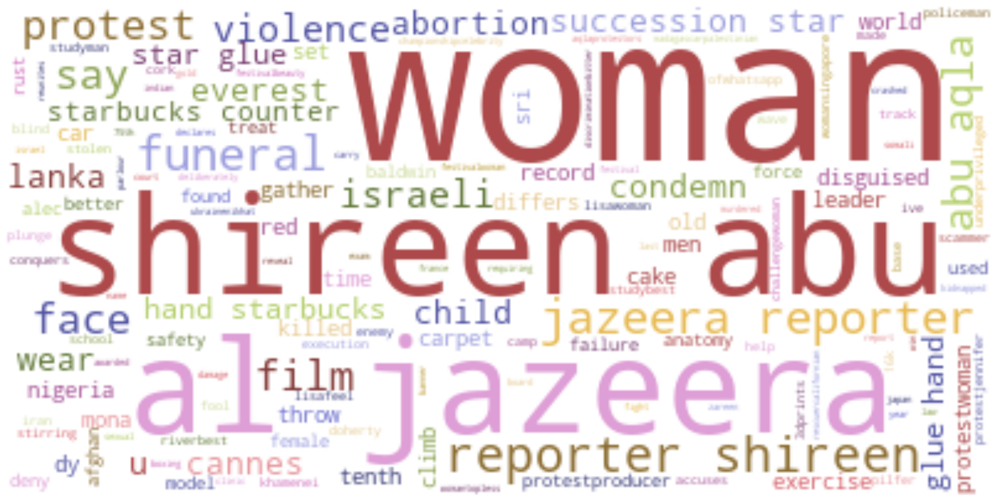

In [149]:
#BBC Cluster 0 Wordcloud 

#Load BBC Cluster0 as pandas df
BC0=pd.read_csv('BBCcluster0.csv') 

#create text list of all words in Fox cluster 0
Btext="".join(review for review in BC0.Text.astype(str))

#Generate word cloud
BC0_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
BC0_WC.generate(Btext)
plt.figure(figsize=(20,10))
plt.imshow(BC0_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

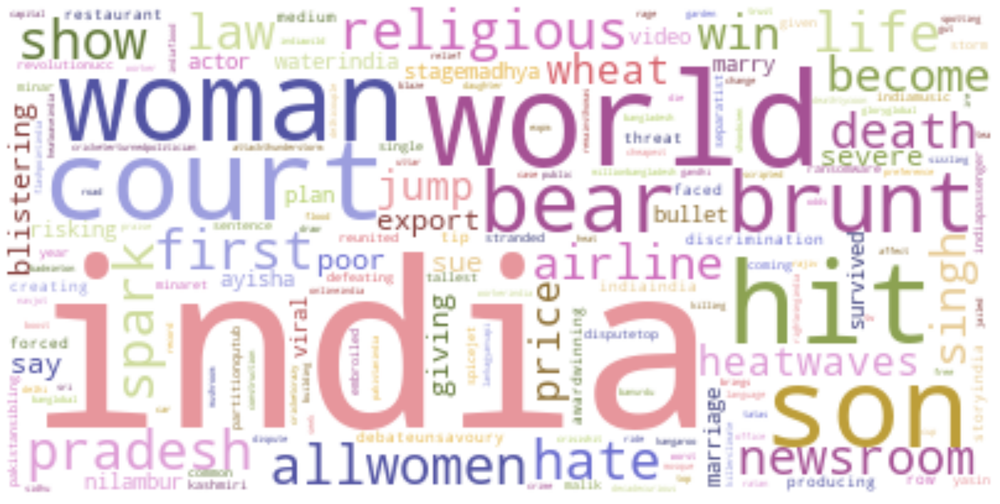

In [150]:
#BBC Cluster 1 Wordcloud 


BC1=pd.read_csv('BBCcluster1.csv') 

#create text list of all words in BBC cluster 1
Btext1="".join(review for review in BC1.Text.astype(str))

#Generate word cloud
BC1_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
BC1_WC.generate(Btext1)
plt.figure(figsize=(20,10))
plt.imshow(BC1_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()




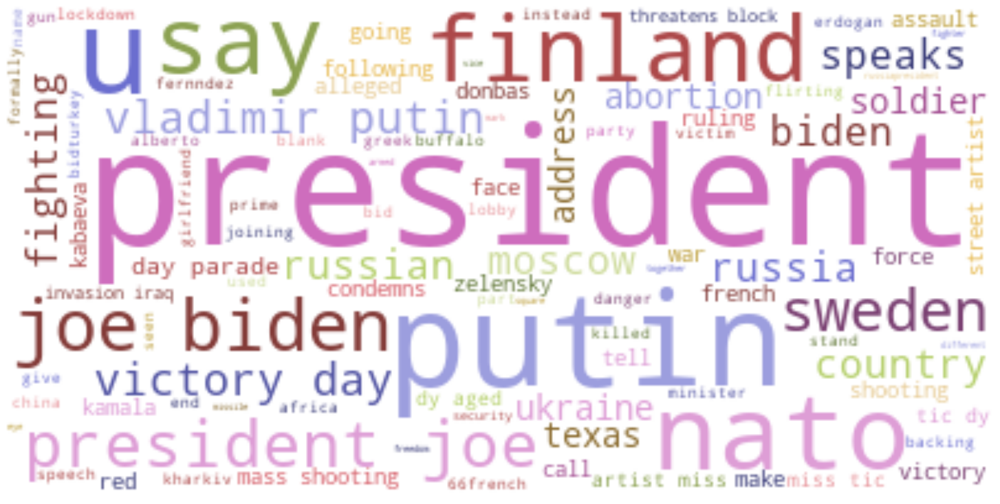

In [151]:
#BBC Cluster 2 Wordcloud 


BC2=pd.read_csv('BBCcluster2.csv') 

#create text list of all words in BBC cluster 2
Btext2="".join(review for review in BC2.Text.astype(str))

#Generate word cloud
BC2_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
BC2_WC.generate(Btext2)
plt.figure(figsize=(20,10))
plt.imshow(BC2_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()



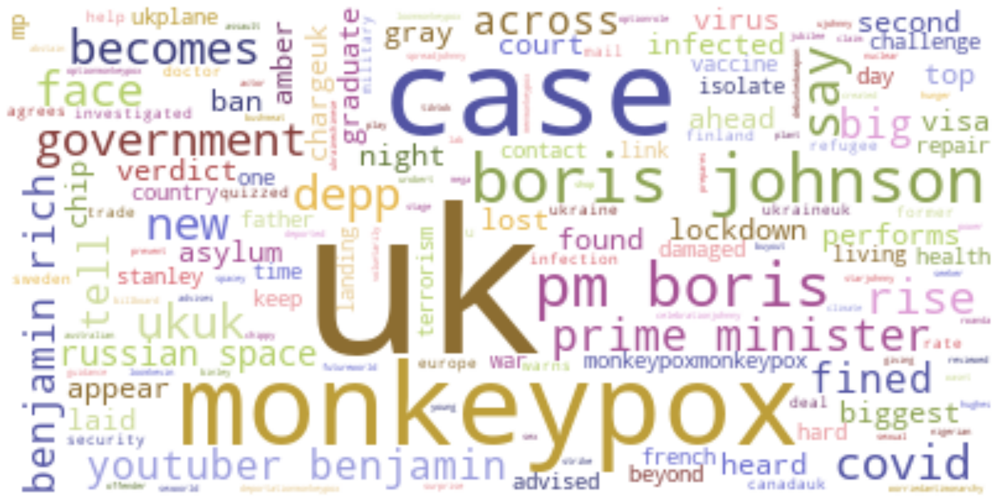

In [152]:
#BBC Cluster 3 Wordcloud 


BC3=pd.read_csv('BBCcluster3.csv') 

#create text list of all words in BBC cluster 3
Btext3="".join(review for review in BC3.Text.astype(str))

#Generate word cloud
BC3_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
BC3_WC.generate(Btext3)
plt.figure(figsize=(20,10))
plt.imshow(BC3_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()



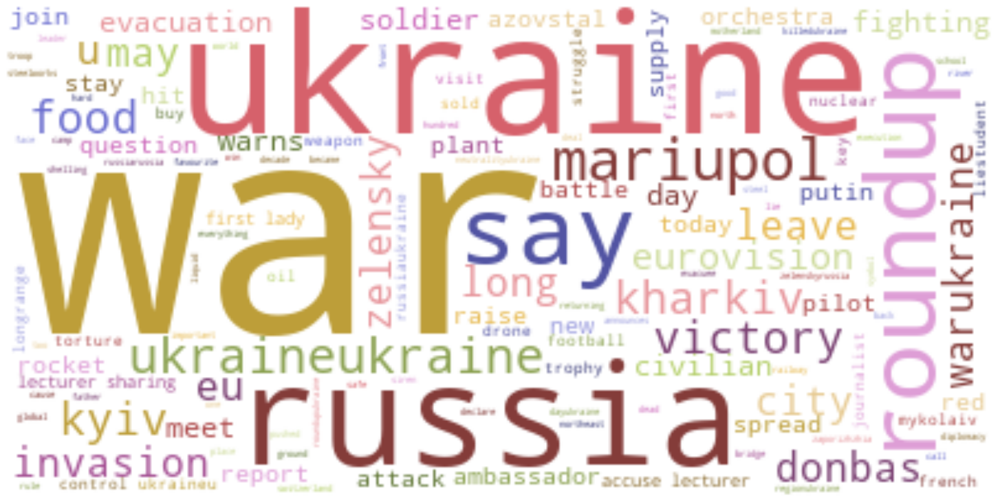

In [153]:
#BBC Cluster 4 Wordcloud 


BC4=pd.read_csv('BBCcluster4.csv') 

#create text list of all words in BBC cluster 4
Btext4="".join(review for review in BC4.Text.astype(str))

#Generate word cloud
BC4_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
BC4_WC.generate(Btext4)
plt.figure(figsize=(20,10))
plt.imshow(BC4_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

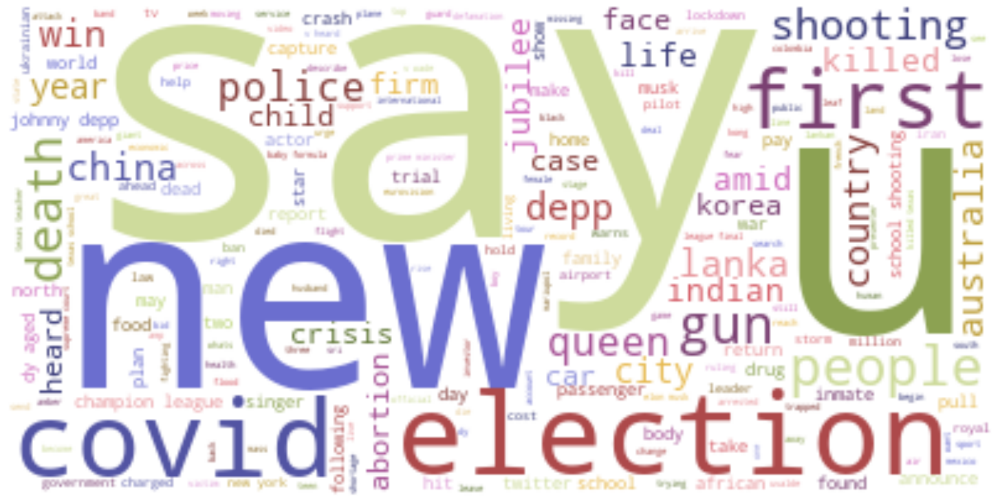

In [154]:
#BBC Cluster 5 Wordcloud 


BC5=pd.read_csv('BBCcluster5.csv') 

#create text list of all words in BBC cluster 5
Btext5="".join(review for review in BC5.Text.astype(str))

#Generate word cloud
BC5_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
BC5_WC.generate(Btext5)
plt.figure(figsize=(20,10))
plt.imshow(BC5_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

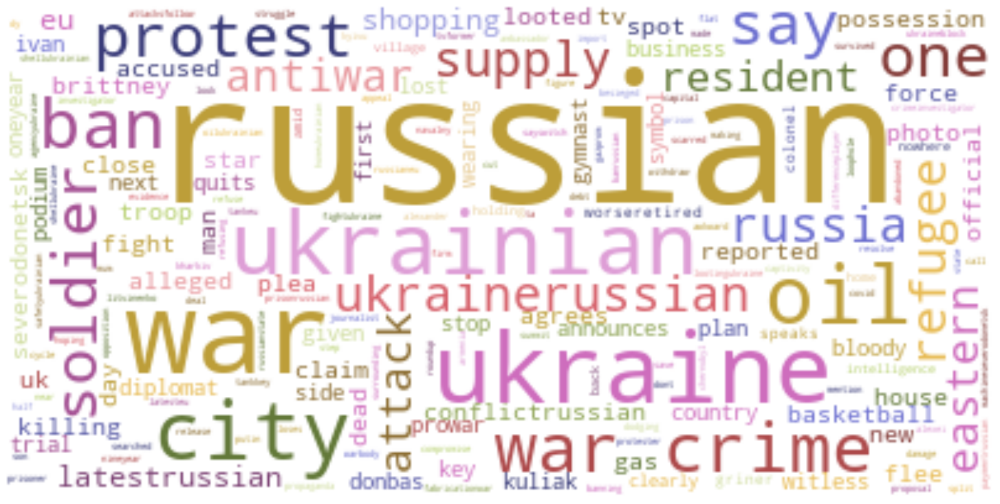

In [155]:
#BBC Cluster 6 Wordcloud 


BC6=pd.read_csv('BBCcluster6.csv') 

#create text list of all words in BBC cluster 6
Btext6="".join(review for review in BC6.Text.astype(str))

#Generate word cloud
BC6_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
BC6_WC.generate(Btext6)
plt.figure(figsize=(20,10))
plt.imshow(BC6_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Sentiment Analysis

In [156]:


BBC_clean_tweets['polarity'] =BBC_clean_tweets['Text'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)


In [157]:
BBC_clean_tweets['subjectivity'] = BBC_clean_tweets['Text'].apply(lambda tweet: TextBlob(tweet).sentiment.subjectivity)



In [158]:
Bscore = BBC_clean_tweets["polarity"].values
Bsentiment = []
for i in Bscore:
    if i >= 0.05 :
        Bsentiment.append('Positive')
    elif i <= -0.05 :
        Bsentiment.append('Negative')
    else:
        Bsentiment.append('Neutral')
BBC_clean_tweets["Sentiment"] = Bsentiment

Bsubscore = BBC_clean_tweets["subjectivity"].values
Bsub = []
for i in Bsubscore:
    if i >= 0.6 :
        Bsub.append('Highly Subjective')
    elif i <= 0.4 :
        Bsub.append('Objective')
    else:
        Bsub.append('Subjective')
BBC_clean_tweets["Subjective"] = Bsub

BBC_clean_tweets

,Datetime,Text,User,likeCount,cluster,polarity,subjectivity,Sentiment,Subjective
0,2022-06-04 23:51:17+00:00,bangladesh five killed score injured depot blast,BBCWorld,180,5,-0.2,0.0,Negative,Objective
1,2022-06-04 23:10:43+00:00,queen platinum jubilee nigerian bos applied mo...,BBCWorld,483,5,0.0,0.0,Neutral,Objective
2,2022-06-04 20:21:56+00:00,nigeria clash abuja mob burn man death row mus...,BBCWorld,343,5,0.0,0.0,Neutral,Objective
3,2022-06-04 18:56:30+00:00,ukraine roundup defiance mykolaiv wooden monas...,BBCWorld,289,4,0.0,0.0,Neutral,Objective
4,2022-06-04 16:49:14+00:00,ukraine anger macron say dont humiliate russia,BBCWorld,4192,4,-0.7,0.2,Negative,Objective
...,...,...,...,...,...,...,...,...,...
1496,2022-05-01 16:59:06+00:00,snapchats flying selfie drone,BBCWorld,238,5,0.0,0.0,Neutral,Objective
1497,2022-05-01 16:52:40+00:00,mariupol civilian evacuation begin ukraine rus...,BBCWorld,388,4,0.0,0.0,Neutral,Objective
1498,2022-05-01 16:26:38+00:00,satellite image capture damage avozstal steelw...,BBCWorld,246,5,0.5,0.9,Positive,Highly Subjective
1499,2022-05-01 15:59:21+00:00,kylie minogue jason donovan return neighbour,BBCWorld,319,5,0.0,0.0,Neutral,Objective


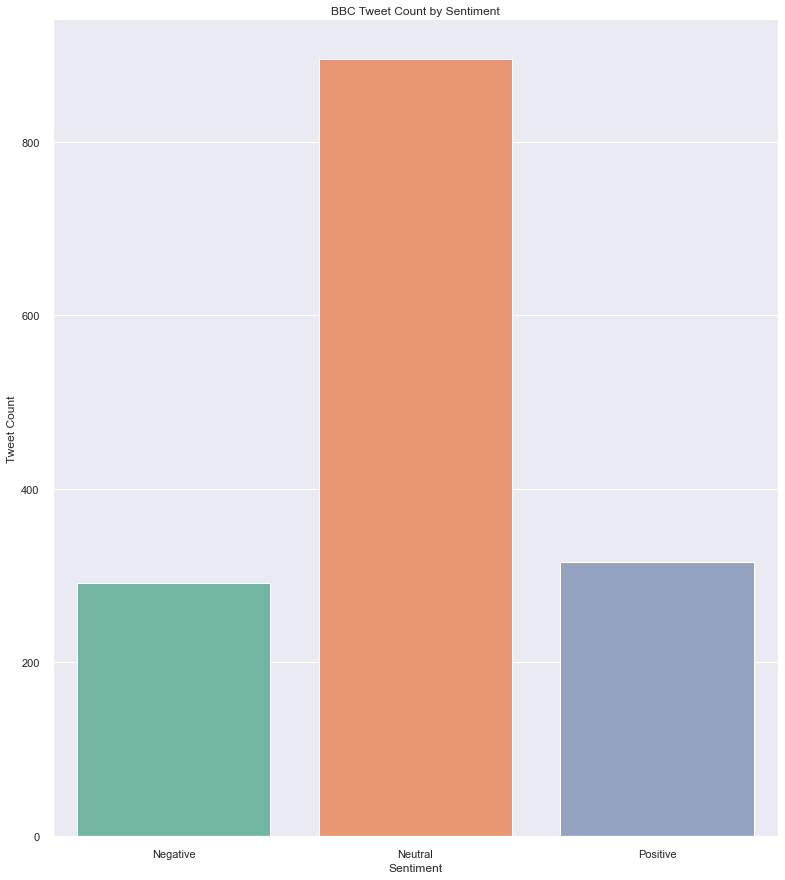

In [159]:
#Visualization of Sentiment results

sns.set_style('darkgrid')
sns.set_palette('Set2')
FoxSent=sns.countplot(data=BBC_clean_tweets, x='Sentiment')
plt.title('BBC Tweet Count by Sentiment')
plt.xlabel('Sentiment')
plt.ylabel('Tweet Count')
sns.despine()
plt.show()


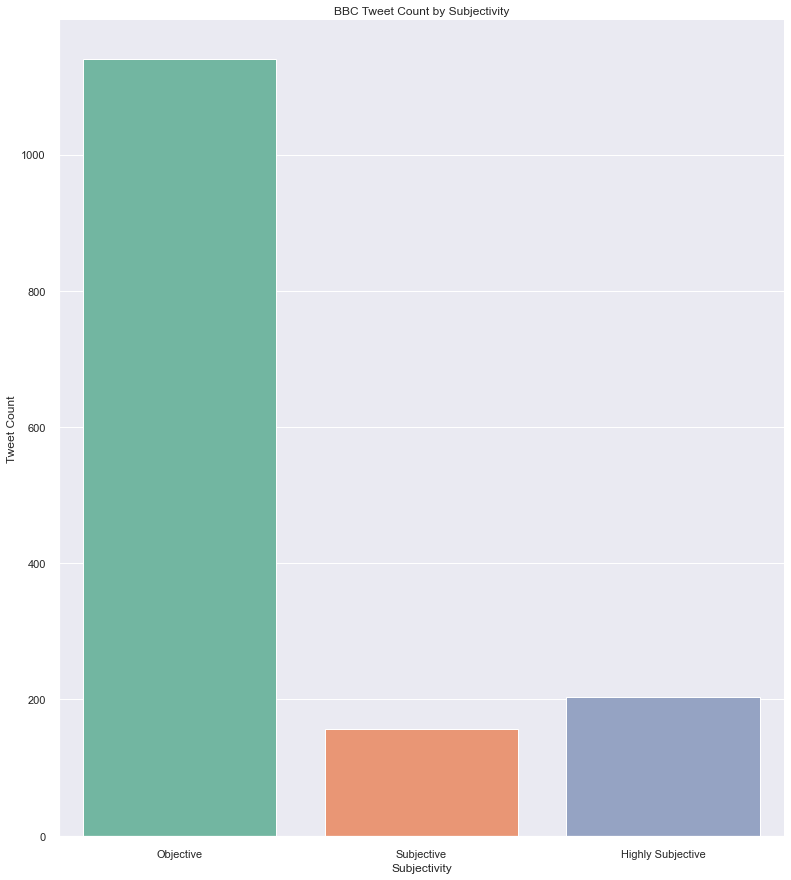

In [160]:
#Visualization of Subjectivity results
sns.set_style('darkgrid')
sns.set_palette('Set2')
FoxSent=sns.countplot(data=BBC_clean_tweets, x='Subjective')
plt.title('BBC Tweet Count by Subjectivity')
plt.xlabel('Subjectivity')
plt.ylabel('Tweet Count')
sns.despine()
plt.show()



## CNN News

In [161]:
# Creating list to append tweet data 
CNN_tweets_list1 = []
query='(from:CNN)until:2022-06-05 since:2022-04-01'

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper(query=query).get_items()): #CNN and within bounded dates 
    if i>1500: #number of tweets you want to scrape
        break
    try:
        CNN_tweets_list1.append([tweet.date, tweet.content, tweet.user.username,tweet.likeCount]) #declare the attributes to be returned
    except:
        continue
# Creating a dataframe from the tweets list above 
CNN_tweets_df1 = pd.DataFrame(CNN_tweets_list1, columns=['Datetime', 'Text', 'User','likeCount'])  
print(dir(tweet))

['__annotations__', '__class__', '__dataclass_fields__', '__dataclass_params__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'cashtags', 'content', 'conversationId', 'coordinates', 'date', 'hashtags', 'id', 'inReplyToTweetId', 'inReplyToUser', 'json', 'lang', 'likeCount', 'media', 'mentionedUsers', 'outlinks', 'outlinksss', 'place', 'quoteCount', 'quotedTweet', 'renderedContent', 'replyCount', 'retweetCount', 'retweetedTweet', 'source', 'sourceLabel', 'sourceUrl', 'tcooutlinks', 'tcooutlinksss', 'url', 'user', 'username']


In [162]:
CNN_tweets_df1

,Datetime,Text,User,likeCount
0,2022-06-04 23:30:07+00:00,Jeff Bezos’ Blue Origin carried its fifth grou...,CNN,478
1,2022-06-04 23:16:42+00:00,“Raising the age would’ve saved my daughter.”\...,CNN,2465
2,2022-06-04 23:10:03+00:00,"Ann Turner Cook, whose familiar face has been ...",CNN,1498
3,2022-06-04 23:00:16+00:00,Races at the state and local level will have c...,CNN,159
4,2022-06-04 22:31:04+00:00,The death of a young reporter has shed a spotl...,CNN,191
...,...,...,...,...
1496,2022-05-18 07:23:46+00:00,"6 takeaways from primaries in Pennsylvania, No...",CNN,123
1497,2022-05-18 07:00:15+00:00,After Renault announced its departure this wee...,CNN,352
1498,2022-05-18 06:59:09+00:00,Over a third of adults have sleep problems. A ...,CNN,160
1499,2022-05-18 06:30:12+00:00,"If you've been away from Twitter lately, first...",CNN,269


In [163]:
#Clean CNN Tweets
CNN_clean_tweets = clean_text(CNN_tweets_df1, 'Text')
CNN_clean_tweets.Text = CNN_clean_tweets.Text.apply(furnished)
CNN_clean_tweets

,Datetime,Text,User,likeCount
0,2022-06-04 23:30:07+00:00,jeff bezos blue origin carried fifth group pas...,CNN,478
1,2022-06-04 23:16:42+00:00,raising age wouldve saved daughterguttenberg f...,CNN,2465
2,2022-06-04 23:10:03+00:00,ann turner cook whose familiar face printed th...,CNN,1498
3,2022-06-04 23:00:16+00:00,race state local level consequence extend far ...,CNN,159
4,2022-06-04 22:31:04+00:00,death young reporter shed spotlight astronomic...,CNN,191
...,...,...,...,...
1496,2022-05-18 07:23:46+00:00,6 takeaway primary pennsylvania north carolina,CNN,123
1497,2022-05-18 07:00:15+00:00,renault announced departure week russian auto ...,CNN,352
1498,2022-05-18 06:59:09+00:00,third adult sleep problem startup hope make di...,CNN,160
1499,2022-05-18 06:30:12+00:00,youve away twitter lately first good here quic...,CNN,269


### K-Means Clustering

In [164]:
#Changing the tweet to unicode, 
#it is univsersal we will change string to unicode then use vectorizer
CNNDoc=CNN_clean_tweets['Text'].values.astype('U')

In [165]:
vectorizer = TfidfVectorizer(stop_words= 'english')
CNNfeatures=vectorizer.fit_transform(CNNDoc)

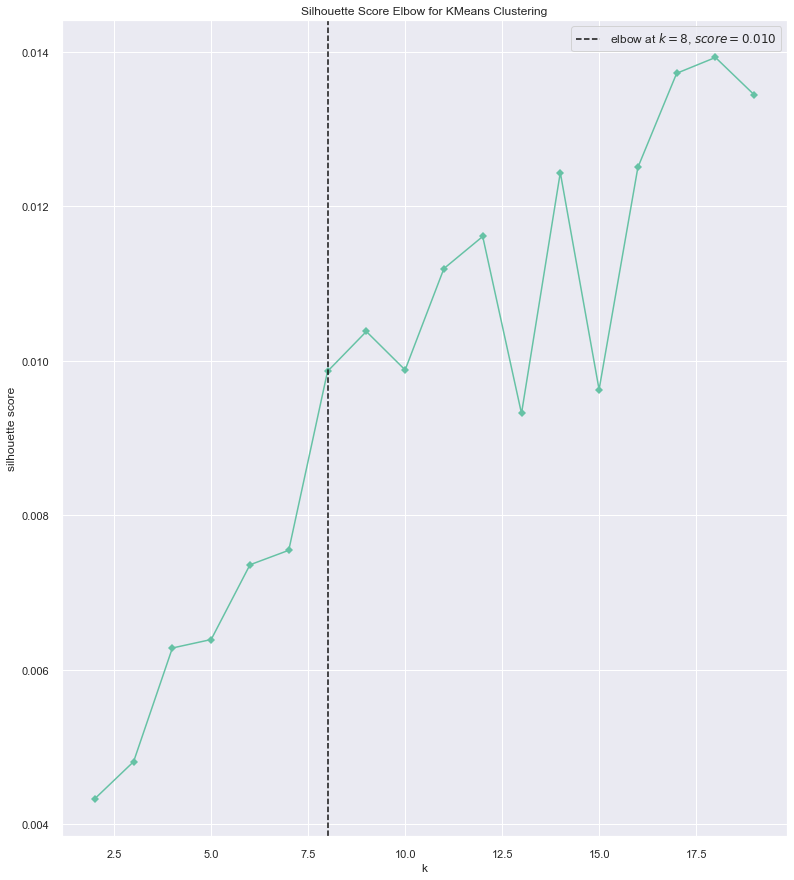

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [183]:
# Instantiate the clustering model and visualizer 
model=KMeans()
visualizer = KElbowVisualizer(model, k=(2,20), metric='silhouette', timings=False)

visualizer.fit(CNNfeatures.toarray())# convert sparse matrix to dense data and fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

In [184]:
k=8
CNNModel = KMeans(n_clusters=k,init='k-means++',max_iter=100,n_init=1)
CNNModel.fit(CNNfeatures)

KMeans(max_iter=100, n_init=1)

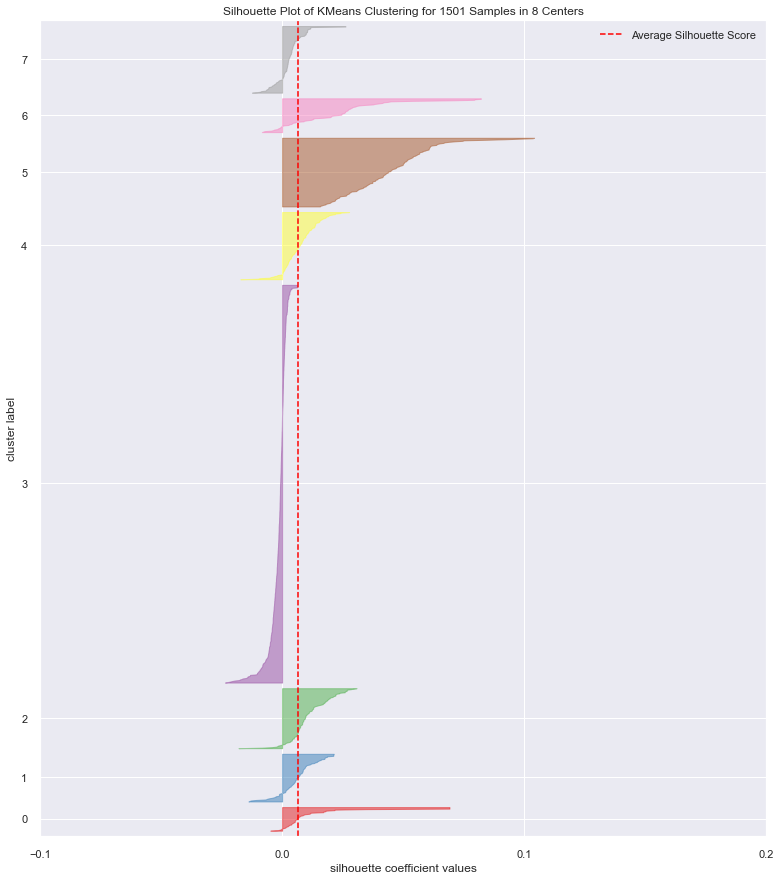

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 1501 Samples in 8 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [187]:
visualizer=SilhouetteVisualizer(CNNModel)
visualizer.fit(CNNfeatures)
visualizer.poof()

In [188]:
CNN_clean_tweets['cluster']=CNNModel.labels_

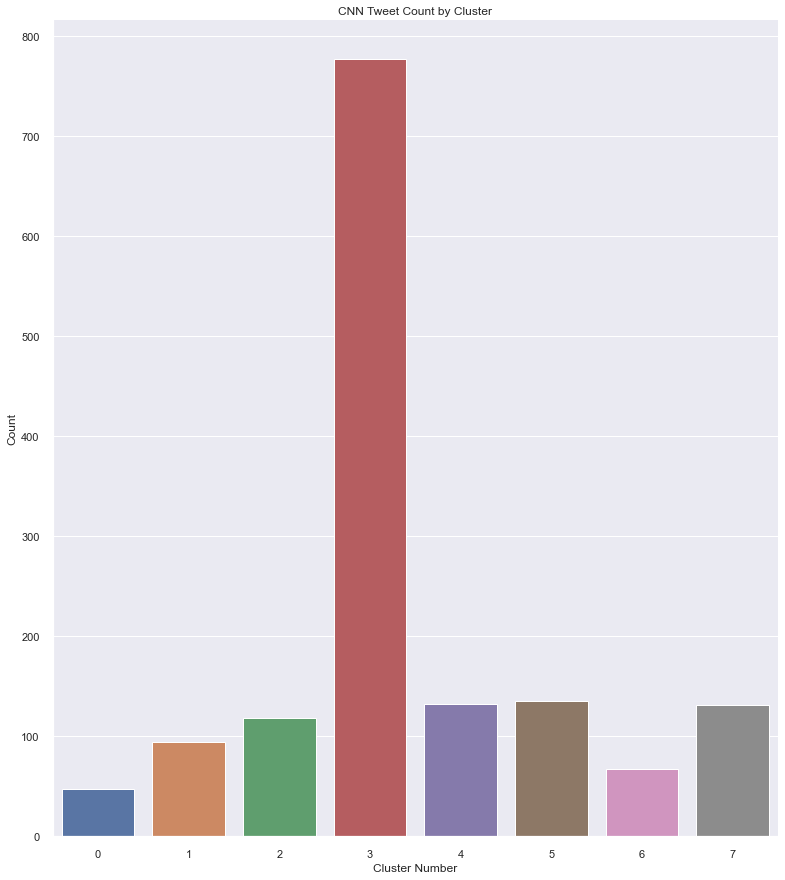

In [189]:
#Distribution of Fox Tweets by Cluster

#set seaborn plotting aesthetics
CNN_clean_tweets.sort_values(by=['cluster'])
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.set(rc={'figure.figsize':(13,15)})
CNN_clustersfreq=sns.countplot(data=CNN_clean_tweets, x='cluster')
plt.title('CNN Tweet Count by Cluster')
plt.xlabel('Cluster Number')
plt.ylabel('Count')
plt.xticks(rotation=360)
sns.despine()
plt.show()

In [190]:
# Output cluster results to a csv file
CNNclusters=CNN_clean_tweets.groupby('cluster')
for cluster in CNNclusters.groups:
    f=open('Ccluster'+str(cluster)+'.csv','w') #create a csv file
    data=CNNclusters.get_group(cluster)[['Datetime','Text']] #include columns of interest
    f.write(data.to_csv(index=True))
    f.close()

In [191]:
#What is Clustering referring to?
#Check central of gravity of clusters and print feature forms

print('CNN Cluster centroids: \n')
Corder_centroids=CNNModel.cluster_centers_.argsort()[:,::-1]
terms=vectorizer.get_feature_names()

for i in range(k):
    print('Cluster %d:' % i)
    for j in Corder_centroids[i, :10]:
        print(' %s' % terms[j])
    print('------------')

CNN Cluster centroids: 

Cluster 0:
 nation
 giant
 trying
 energy
 united
 master
 tethering
 coke
 litter
 state
------------
Cluster 1:
 people
 killed
 police
 officer
 injured
 oklahoma
 medical
 dead
 said
 chief
------------
Cluster 2:
 new
 york
 city
 state
 home
 according
 court
 announced
 gun
 law
------------
Cluster 3:
 watch
 say
 year
 baby
 president
 report
 cnns
 ukraine
 formula
 russian
------------
Cluster 4:
 primary
 war
 listen
 georgia
 republican
 cnn
 thing
 gop
 pennsylvania
 trump
------------
Cluster 5:
 school
 texas
 shooting
 uvalde
 elementary
 robb
 killed
 child
 mass
 19
------------
Cluster 6:
 pm
 reed
 mass
 trevor
 shooting
 et
 sunday
 etpt
 join
 interview
------------
Cluster 7:
 said
 woman
 official
 national
 got
 park
 president
 animal
 say
 biden
------------


/Users/hurtado/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


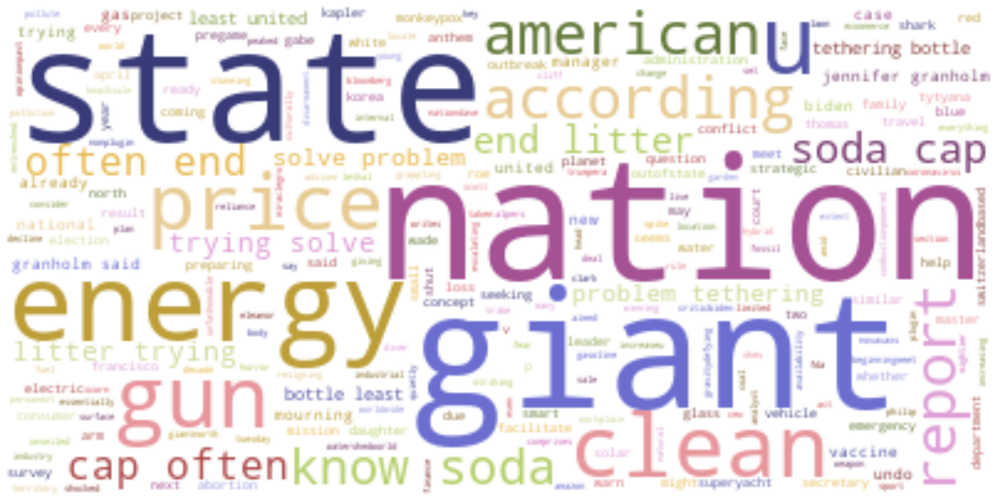

In [192]:
#CNN Cluster 0 Wordcloud 

CC0=pd.read_csv('Ccluster0.csv') 

#create text list of all words in CNN cluster 0
Ctext="".join(review for review in CC0.Text.astype(str))

#Generate word cloud
CC0_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
CC0_WC.generate(Ctext)
plt.figure(figsize=(20,10))
plt.imshow(CC0_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

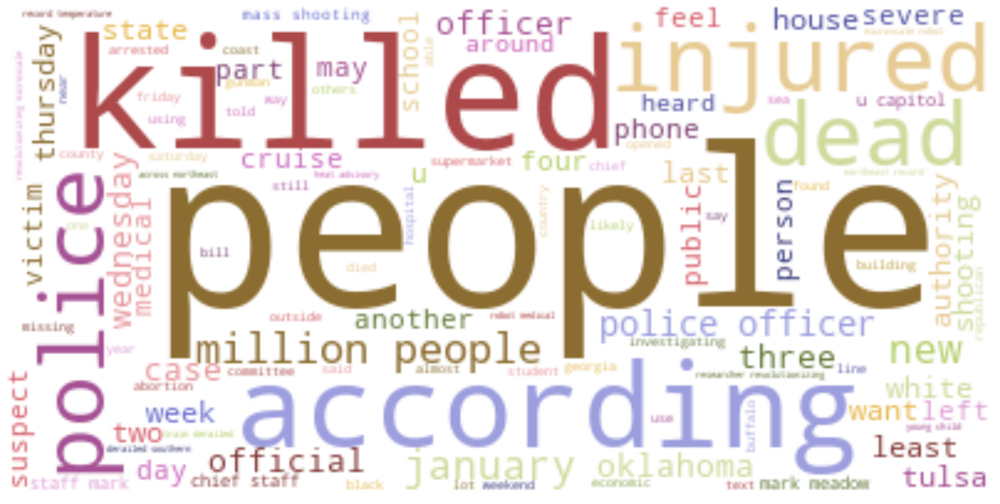

In [193]:
#CNN Cluster 1 Wordcloud 

CC1=pd.read_csv('Ccluster1.csv') 

#create text list of all words in CNN cluster 1
Ctext1="".join(review for review in CC1.Text.astype(str))

#Generate word cloud
CC1_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
CC1_WC.generate(Ctext1)
plt.figure(figsize=(20,10))
plt.imshow(CC1_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()


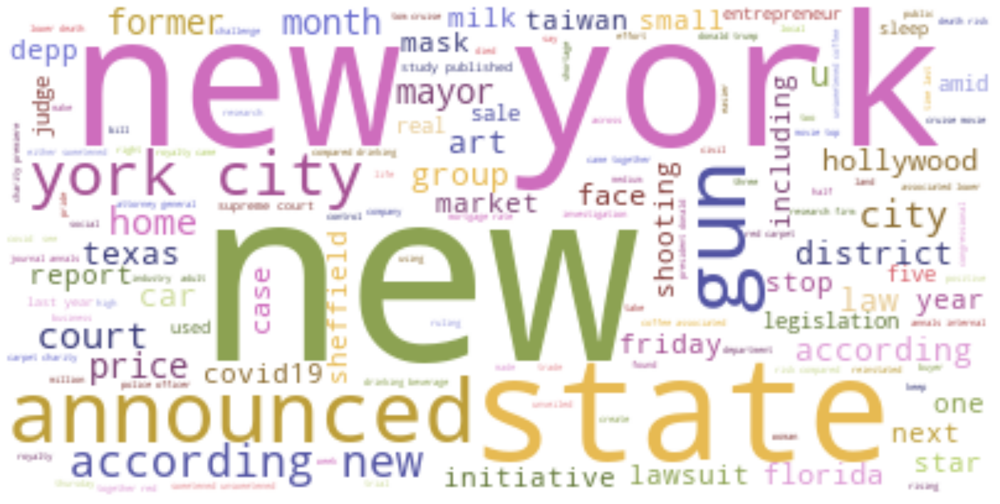

In [194]:
#CNN Cluster 2 Wordcloud 

CC2=pd.read_csv('Ccluster2.csv') 

#create text list of all words in CNN cluster 2
Ctext2="".join(review for review in CC2.Text.astype(str))

#Generate word cloud
CC2_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
CC2_WC.generate(Ctext2)
plt.figure(figsize=(20,10))
plt.imshow(CC2_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

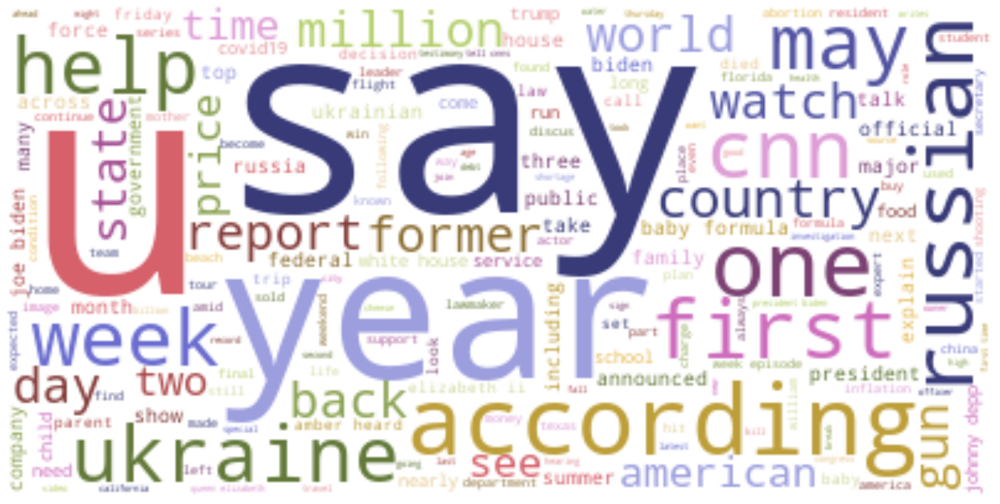

In [195]:
#CNN Cluster 3 Wordcloud 

CC3=pd.read_csv('Ccluster3.csv') 

#create text list of all words in CNN cluster 3
Ctext3="".join(review for review in CC3.Text.astype(str))

#Generate word cloud
CC3_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
CC3_WC.generate(Ctext3)
plt.figure(figsize=(20,10))
plt.imshow(CC3_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

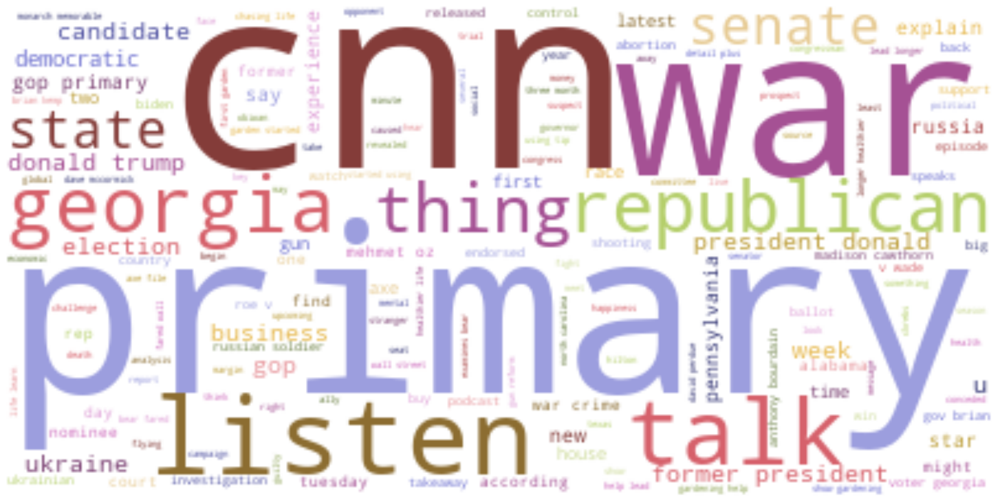

In [196]:
#CNN Cluster 4 Wordcloud 

CC4=pd.read_csv('Ccluster4.csv') 

#create text list of all words in CNN cluster 4
Ctext4="".join(review for review in CC4.Text.astype(str))

#Generate word cloud
CC4_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
CC4_WC.generate(Ctext4)
plt.figure(figsize=(20,10))
plt.imshow(CC4_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

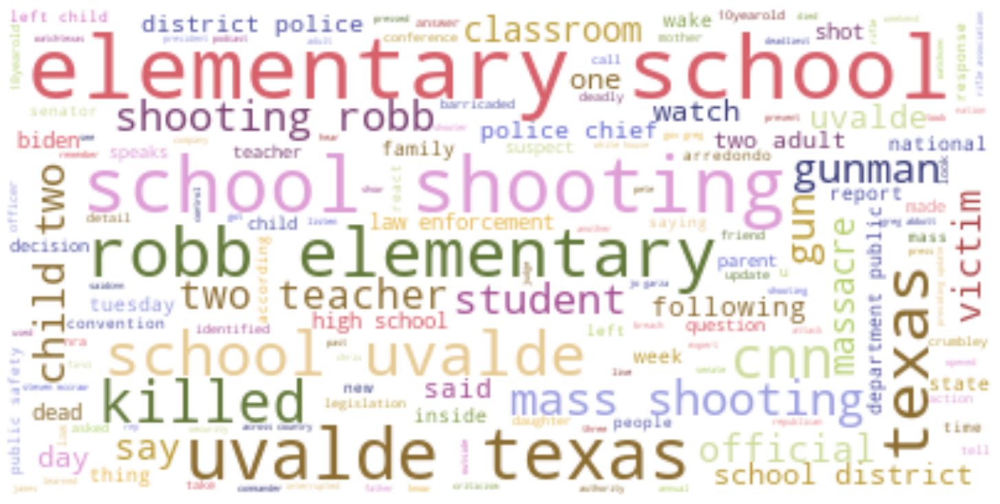

In [197]:
#CNN Cluster 5 Wordcloud 

CC5=pd.read_csv('Ccluster5.csv') 

#create text list of all words in CNN cluster 5
Ctext5="".join(review for review in CC5.Text.astype(str))

#Generate word cloud
CC5_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
CC5_WC.generate(Ctext5)
plt.figure(figsize=(20,10))
plt.imshow(CC5_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

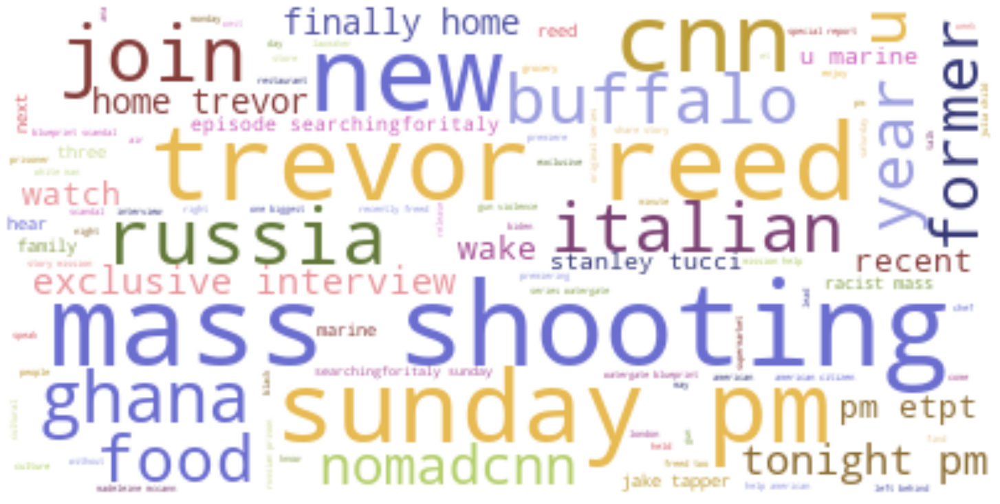

In [198]:
#CNN Cluster 6 Wordcloud 

CC6=pd.read_csv('Ccluster6.csv') 

#create text list of all words in CNN cluster 6
Ctext6="".join(review for review in CC6.Text.astype(str))

#Generate word cloud
CC6_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
CC6_WC.generate(Ctext6)
plt.figure(figsize=(20,10))
plt.imshow(CC6_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

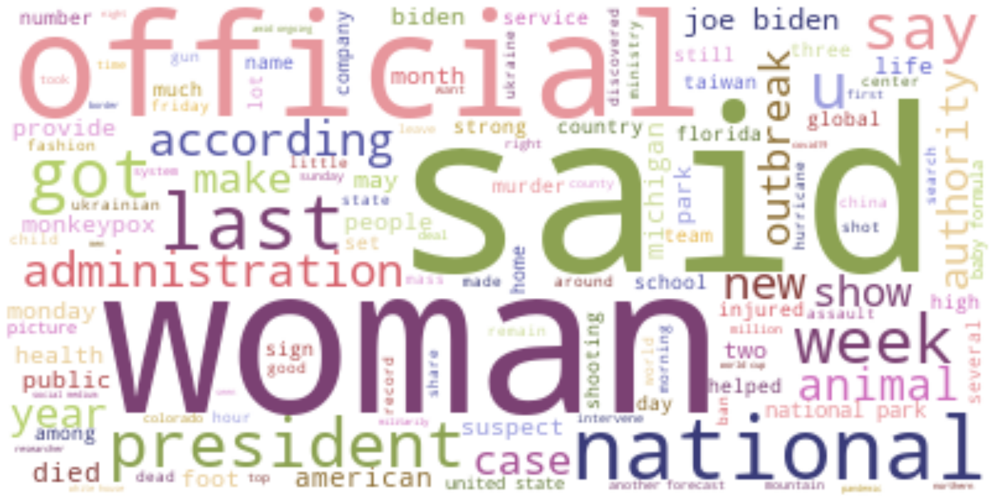

In [199]:
#CNN Cluster 7 Wordcloud 

CC7=pd.read_csv('Ccluster7.csv') 

#create text list of all words in CNN cluster 7
Ctext7="".join(review for review in CC7.Text.astype(str))

#Generate word cloud
CC7_WC=WordCloud(colormap='tab20b',background_color='white',max_words=1000)
CC7_WC.generate(Ctext7)
plt.figure(figsize=(20,10))
plt.imshow(CC7_WC, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Sentiment Analysis

In [200]:
CNN_clean_tweets['polarity'] = CNN_clean_tweets['Text'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)

In [201]:
CNN_clean_tweets['subjectivity'] = CNN_clean_tweets['Text'].apply(lambda tweet: TextBlob(tweet).sentiment.subjectivity)

In [202]:
Cscore = CNN_clean_tweets["polarity"].values
Csentiment = []
for i in Cscore:
    if i >= 0.05 :
        Csentiment.append('Positive')
    elif i <= -0.05 :
        Csentiment.append('Negative')
    else:
        Csentiment.append('Neutral')
CNN_clean_tweets["Sentiment"] = Csentiment

In [203]:
Csubscore = CNN_clean_tweets["subjectivity"].values
Csub = []
for i in Csubscore:
    if i >= 0.6 :
        Csub.append('Highly Subjective')
    elif i <= 0.4 :
        Csub.append('Objective')
    else:
        Csub.append('Subjective')
CNN_clean_tweets["Subjective"] = Csub

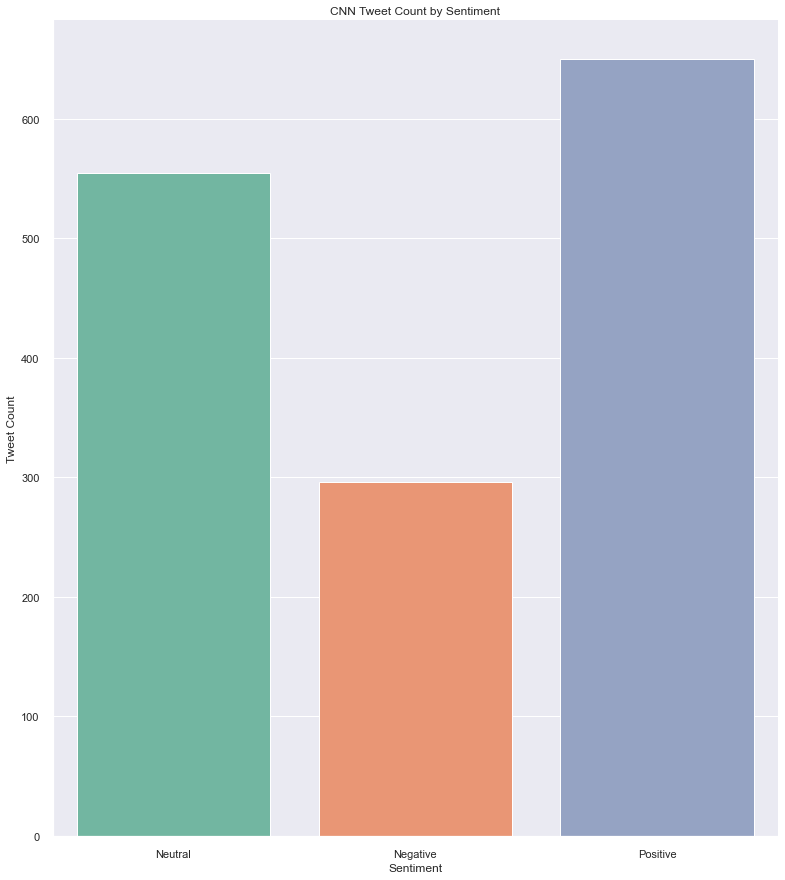

In [204]:
#Visualization of Sentiment results

sns.set_style('darkgrid')
sns.set_palette('Set2')
CNNSent=sns.countplot(data=CNN_clean_tweets, x='Sentiment')
plt.title('CNN Tweet Count by Sentiment')
plt.xlabel('Sentiment')
plt.ylabel('Tweet Count')
sns.despine()
plt.show()


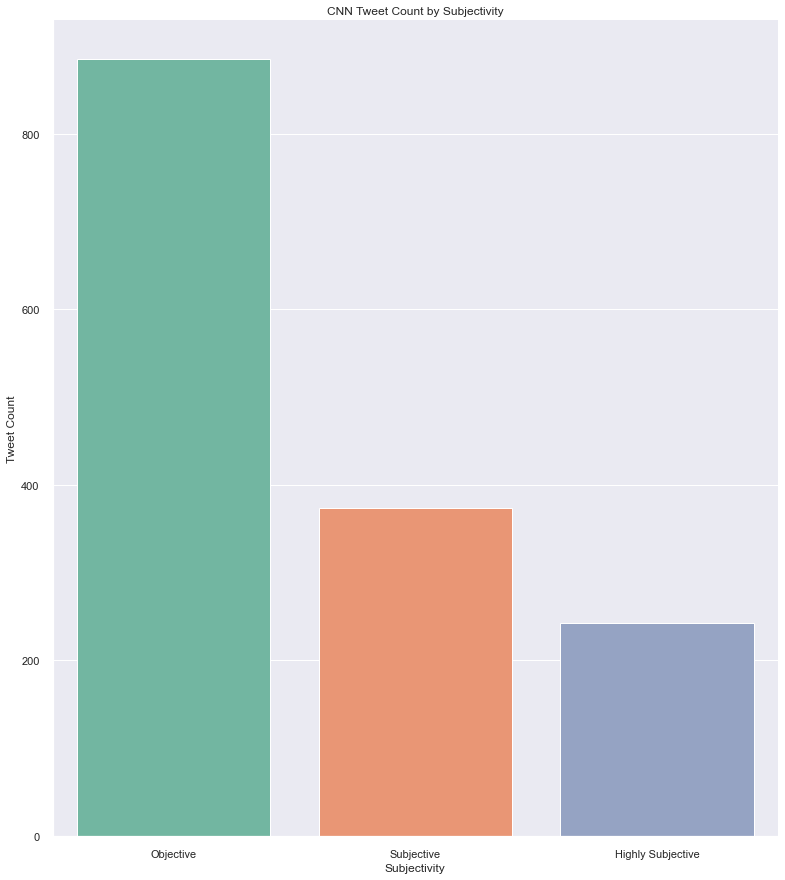

In [205]:
#Visualization of Subjectivity results
sns.set_style('darkgrid')
sns.set_palette('Set2')
CNNSent=sns.countplot(data=CNN_clean_tweets, x='Subjective')
plt.title('CNN Tweet Count by Subjectivity')
plt.xlabel('Subjectivity')
plt.ylabel('Tweet Count')
sns.despine()
plt.show()



### User like ranges by subjective tweets



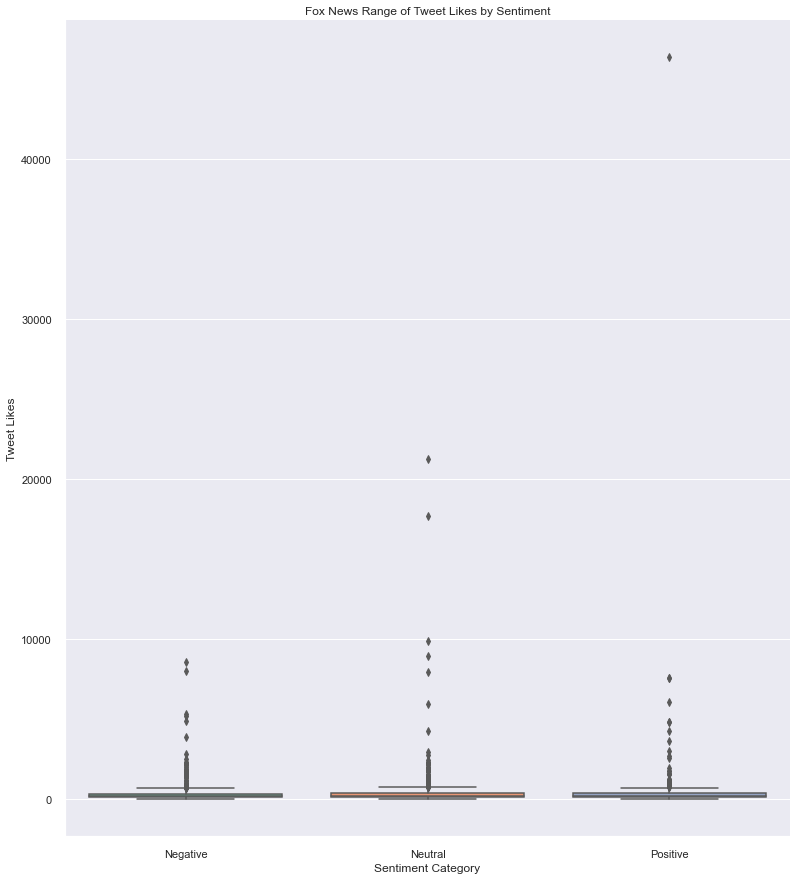

In [208]:
#create Fox likes by Sentiment boxplot 
#set seaborn plotting aesthetics
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.boxplot(x='Sentiment', y='likeCount', data=Fox_clean_tweets)
plt.title('Fox News Range of Tweet Likes by Sentiment')
plt.xlabel('Sentiment Category')
plt.ylabel('Tweet Likes')
sns.despine()
plt.show()

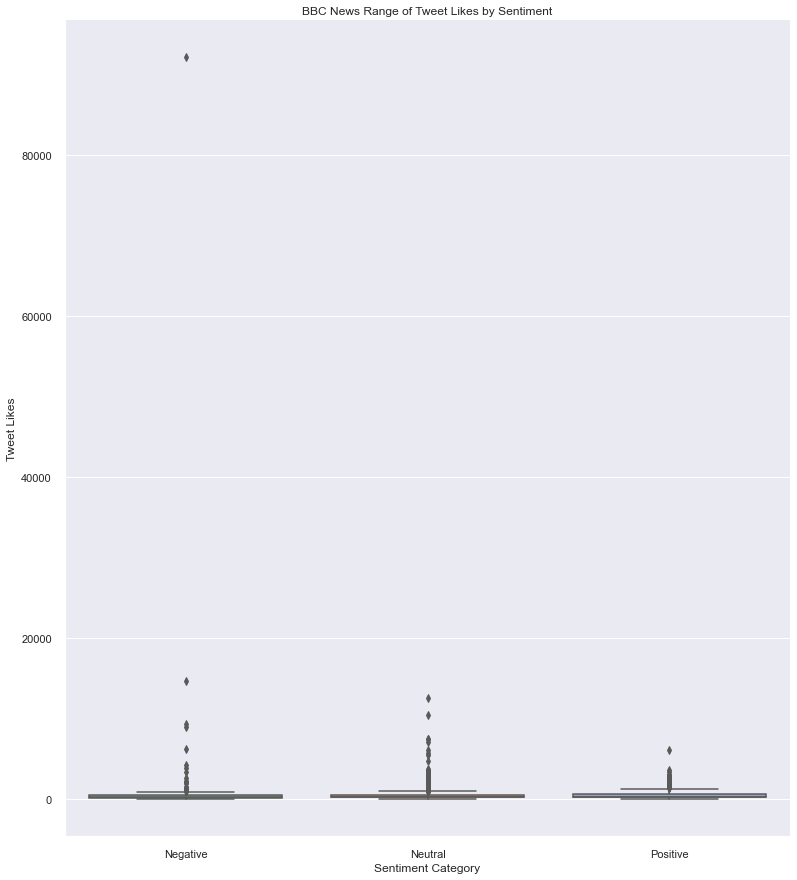

In [210]:
#create BBC likes by Sentiment boxplot 
#set seaborn plotting aesthetics
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.boxplot(x='Sentiment', y='likeCount', data=BBC_clean_tweets)
plt.title('BBC News Range of Tweet Likes by Sentiment')
plt.xlabel('Sentiment Category')
plt.ylabel('Tweet Likes')
sns.despine()
plt.show()

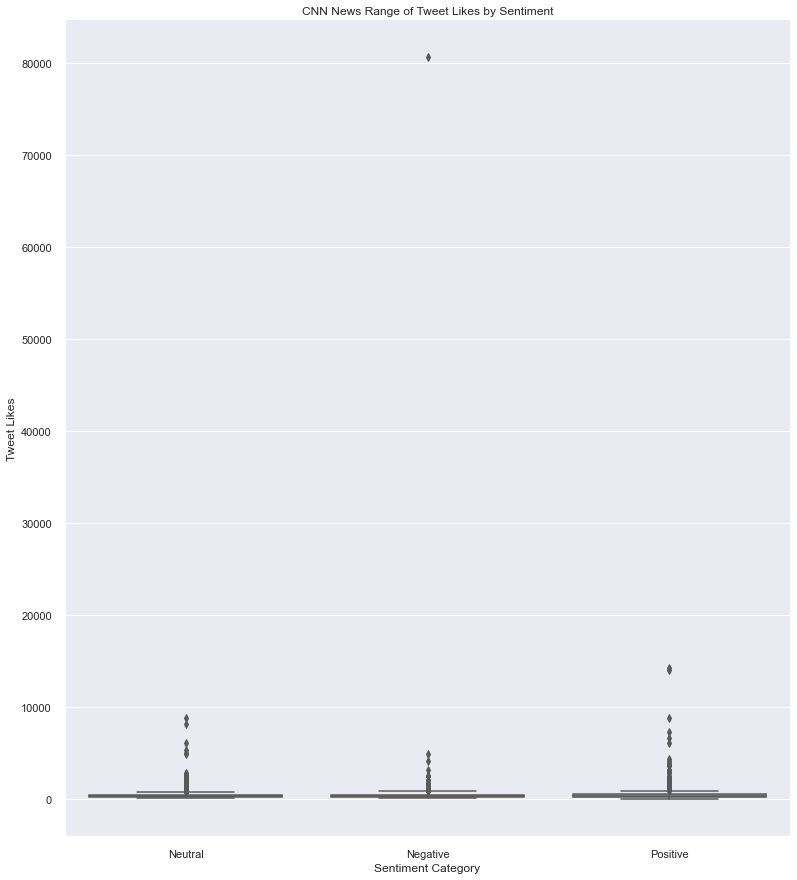

In [211]:
#create CNN likes by Sentiment boxplot 
#set seaborn plotting aesthetics
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.boxplot(x='Sentiment', y='likeCount', data=CNN_clean_tweets)
plt.title('CNN News Range of Tweet Likes by Sentiment')
plt.xlabel('Sentiment Category')
plt.ylabel('Tweet Likes')
sns.despine()
plt.show()

### User Likes by Subjectivity

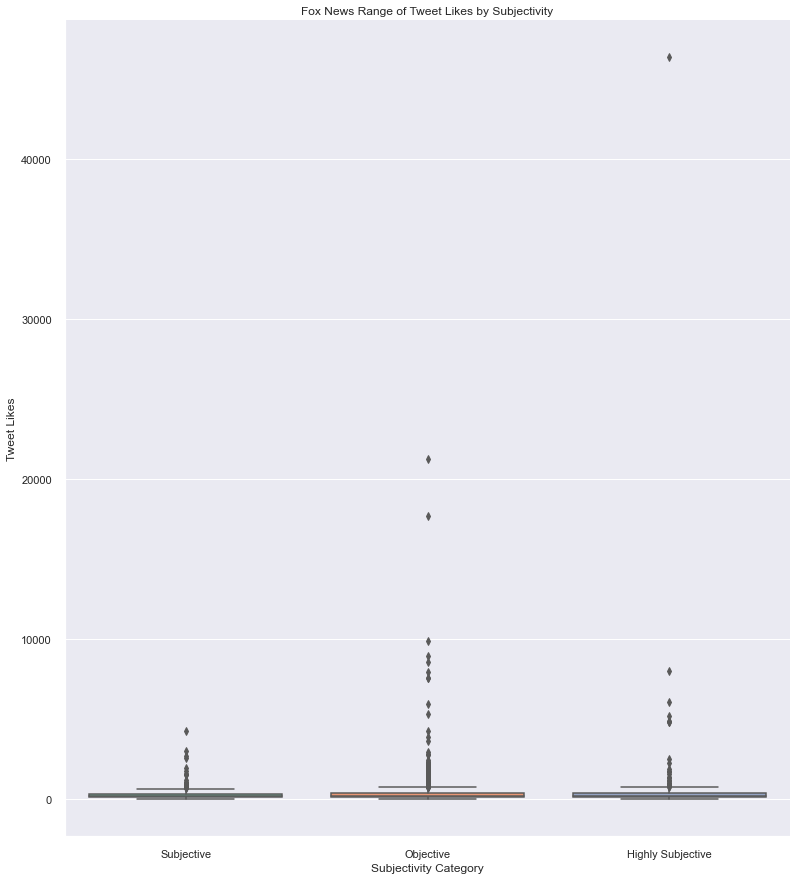

In [209]:
#Create Fox likes by Subjectivity boxplot
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.boxplot(x='Subjective', y='likeCount', data=Fox_clean_tweets)
plt.title('Fox News Range of Tweet Likes by Subjectivity')
plt.xlabel('Subjectivity Category')
plt.ylabel('Tweet Likes')
sns.despine()
plt.show()

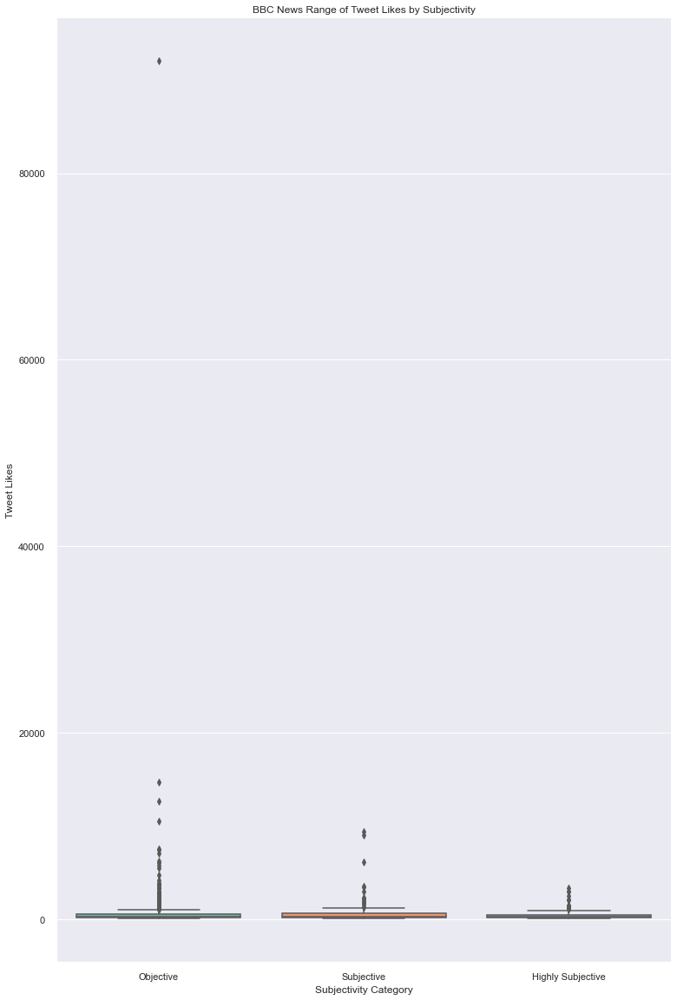

In [216]:
#Create BBC likes by Subjectivity boxplot
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.boxplot(x='Subjective', y='likeCount', data=BBC_clean_tweets)
plt.title('BBC News Range of Tweet Likes by Subjectivity')
plt.xlabel('Subjectivity Category')
plt.ylabel('Tweet Likes')
sns.despine()
plt.show()

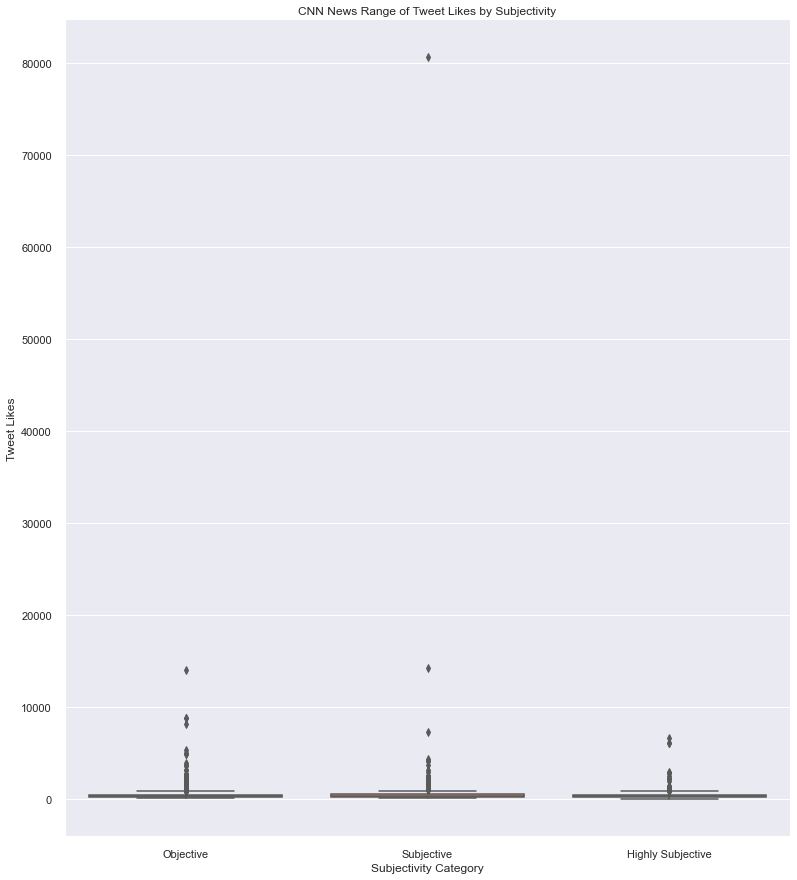

In [213]:
#Create CNN likes by Subjectivity boxplot
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.boxplot(x='Subjective', y='likeCount', data=CNN_clean_tweets)
plt.title('CNN News Range of Tweet Likes by Subjectivity')
plt.xlabel('Subjectivity Category')
plt.ylabel('Tweet Likes')
sns.despine()
plt.show()